### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Import Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns

from scipy.stats import zscore                                        # ZSCORE SCALING
from sklearn.preprocessing import StandardScaler                      # ZScore
from sklearn.preprocessing import MinMaxScaler                        # Min Max Scaler

from sklearn.linear_model import LogisticRegression                   # Logistic Regression
from sklearn.tree import DecisionTreeClassifier                       # Decision tree
from sklearn.ensemble import RandomForestClassifier                   # Random Forest
from sklearn.ensemble import BaggingClassifier                        # Bagging
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis  # LDA
from sklearn.ensemble import AdaBoostClassifier                       # Adaptive Boosting
from sklearn.ensemble import GradientBoostingClassifier               # Gradient Boosting
import xgboost as xgb                                                 # XGBoost
from sklearn import svm                                               # Support Vector Machine
from sklearn.neighbors import KNeighborsClassifier                    # KNN Classifier
from sklearn.naive_bayes import GaussianNB                            # Naive Bayes Classifier

from sklearn import metrics, model_selection                          # Evaluation Metrics
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,accuracy_score,roc_auc_score,roc_curve, precision_recall_curve

from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search


%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('Accent_r')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

### <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#9B59B6">Problem 1 - Election Data Exit Polls

#### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#424949"> You are hired by one of the leading news channel CNBE who wants to analyze recent elections. This survey was conducted on 1525 voters with 9 variables. 
    
#### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#424949"> You have to build a model, to predict which party a voter will vote for on the basis of the given information, to create an exit poll that will help in predicting overall win and seats covered by a particular party.

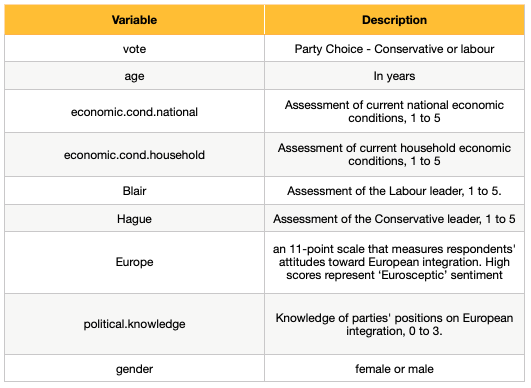


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Load and Explore Dataset

In [2]:
df = pd.read_excel('Election_Data.xlsx', sheet_name='Election_Dataset_Two Classes')
df.drop('Unnamed: 0', axis=1, inplace=True)
df.head(10).to_csv('elec_head.csv')
df.head(10)

,vote,age,economic.cond.national,economic.cond.household,Blair,Hague,Europe,political.knowledge,gender
0,Labour,43,3,3,4,1,2,2,female
1,Labour,36,4,4,4,4,5,2,male
2,Labour,35,4,4,5,2,3,2,male
3,Labour,24,4,2,2,1,4,0,female
4,Labour,41,2,2,1,1,6,2,male
5,Labour,47,3,4,4,4,4,2,male
6,Labour,57,2,2,4,4,11,2,male
7,Labour,77,3,4,4,1,1,0,male
8,Labour,39,3,3,4,4,11,0,female
9,Labour,70,3,2,5,1,11,2,male


In [3]:
df.tail(5).to_csv('elec_tail.csv')
df.tail(5)

,vote,age,economic.cond.national,economic.cond.household,Blair,Hague,Europe,political.knowledge,gender
1520,Conservative,67,5,3,2,4,11,3,male
1521,Conservative,73,2,2,4,4,8,2,male
1522,Labour,37,3,3,5,4,2,2,male
1523,Conservative,61,3,3,1,4,11,2,male
1524,Conservative,74,2,3,2,4,11,0,female


In [4]:
df.shape

(1525, 9)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1525 entries, 0 to 1524
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   vote                     1525 non-null   object
 1   age                      1525 non-null   int64 
 2   economic.cond.national   1525 non-null   int64 
 3   economic.cond.household  1525 non-null   int64 
 4   Blair                    1525 non-null   int64 
 5   Hague                    1525 non-null   int64 
 6   Europe                   1525 non-null   int64 
 7   political.knowledge      1525 non-null   int64 
 8   gender                   1525 non-null   object
dtypes: int64(7), object(2)
memory usage: 107.4+ KB


In [6]:
df.describe().T.to_csv('elec_describe_numeric.csv')
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,1525.0,54.182295,15.711209,24.0,41.0,53.0,67.0,93.0
economic.cond.national,1525.0,3.245902,0.880969,1.0,3.0,3.0,4.0,5.0
economic.cond.household,1525.0,3.140328,0.929951,1.0,3.0,3.0,4.0,5.0
Blair,1525.0,3.334426,1.174824,1.0,2.0,4.0,4.0,5.0
Hague,1525.0,2.746885,1.230703,1.0,2.0,2.0,4.0,5.0
Europe,1525.0,6.728525,3.297538,1.0,4.0,6.0,10.0,11.0
political.knowledge,1525.0,1.542295,1.083315,0.0,0.0,2.0,2.0,3.0


In [7]:
df.describe(include='object').T.to_csv('elec_describe_objects.csv')
df.describe(include='object').T

,count,unique,top,freq
vote,1525,2,Labour,1063
gender,1525,2,female,812


In [8]:
coll=df.columns
cont=[]
for i in range(0, len(coll)):
    if (df[coll[i]].dtypes == 'int64'):
        print('{}  -------->       Mean = {},    Median = {},    CV = {}'.format(coll[i], round(df[coll[i]].mean(), 2), round(df[coll[i]].median(), 2), round(df[coll[i]].std()*100/df[coll[i]].mean(), 2)))
        cont.append(coll[i])

age  -------->       Mean = 54.18,    Median = 53.0,    CV = 29.0
economic.cond.national  -------->       Mean = 3.25,    Median = 3.0,    CV = 27.14
economic.cond.household  -------->       Mean = 3.14,    Median = 3.0,    CV = 29.61
Blair  -------->       Mean = 3.33,    Median = 4.0,    CV = 35.23
Hague  -------->       Mean = 2.75,    Median = 2.0,    CV = 44.8
Europe  -------->       Mean = 6.73,    Median = 6.0,    CV = 49.01
political.knowledge  -------->       Mean = 1.54,    Median = 2.0,    CV = 70.24


In [9]:
cont

['age',
 'economic.cond.national',
 'economic.cond.household',
 'Blair',
 'Hague',
 'Europe',
 'political.knowledge']

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Check and Remove Duplicates

In [10]:
print('Number of Duplicates =',df.duplicated().sum())

Number of Duplicates = 8


In [11]:
# LETS DROP DUPLICATES

df.drop_duplicates(inplace=True)
print('Number of Duplicates after dropping =',df.duplicated().sum())

Number of Duplicates after dropping = 0


In [12]:
print('Shape of the Dataset after dropping Duplicates :\n', df.shape)

Shape of the Dataset after dropping Duplicates :
 (1517, 9)


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Check for Null Values 

In [13]:
print('Number of Missing values =',df.isna().sum().sum())

Number of Missing values = 0


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Check  and Treat Outliers

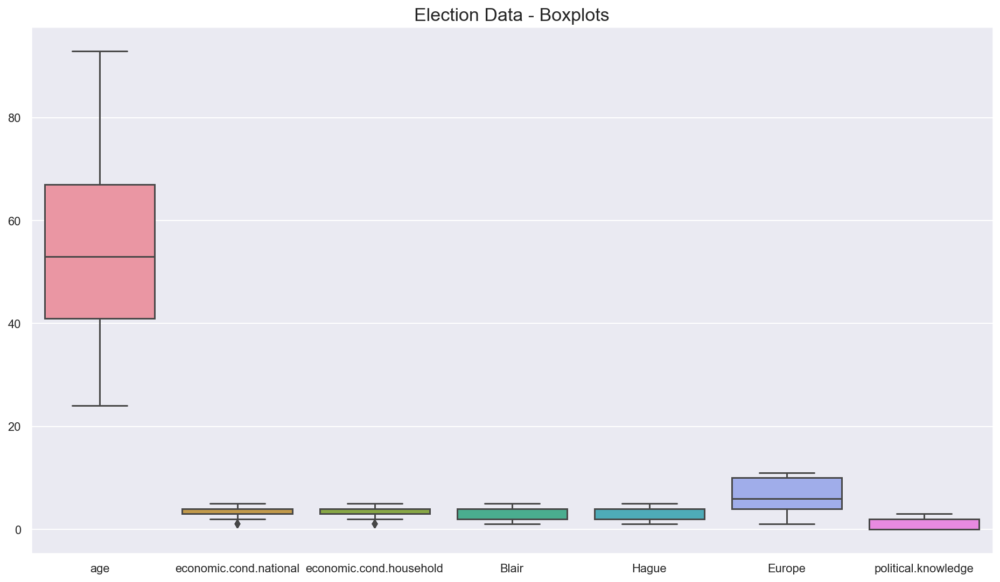

In [14]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=df);
plt.title('Election Data - Boxplots', fontsize=17);

plt.savefig('elec_out.jpg', bbox_inches='tight');

* There are very few Outliers
* Outliers are present in 2 variables - 'economic.cond.household' and 'economic.condition.national'
* But they are variables with ratings, so effectively Categorical variables
* So no need to treat them

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Checking Categorical Variables

In [15]:
df1 = df.copy()
df1.drop(['age'], axis=1, inplace = True)
col = df1.columns
for i in range(0, len(df1.columns)):
        print('====>',col[i].upper(), ' : ', df1[col[i]].nunique())
        print(df1[col[i]].value_counts(sort='ascending'))
        print()

====> VOTE  :  2
Labour          1057
Conservative     460
Name: vote, dtype: int64

====> ECONOMIC.COND.NATIONAL  :  5
3    604
4    538
2    256
5     82
1     37
Name: economic.cond.national, dtype: int64

====> ECONOMIC.COND.HOUSEHOLD  :  5
3    645
4    435
2    280
5     92
1     65
Name: economic.cond.household, dtype: int64

====> BLAIR  :  5
4    833
2    434
5    152
1     97
3      1
Name: Blair, dtype: int64

====> HAGUE  :  5
2    617
4    557
1    233
5     73
3     37
Name: Hague, dtype: int64

====> EUROPE  :  11
11    338
6     207
3     128
4     126
5     123
9     111
8     111
1     109
10    101
7      86
2      77
Name: Europe, dtype: int64

====> POLITICAL.KNOWLEDGE  :  4
2    776
0    454
3    249
1     38
Name: political.knowledge, dtype: int64

====> GENDER  :  2
female    808
male      709
Name: gender, dtype: int64



### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Histograms and Distribution Plots

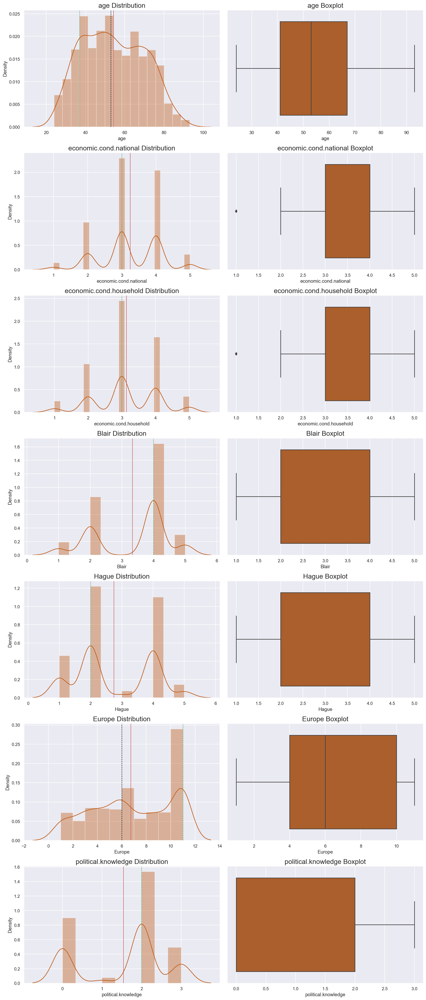

In [16]:
fig, axes = plt.subplots(nrows=7,ncols=2);

        
fig.set_size_inches(15, 35);

for i in range(0, len(cont)):
    
        a = sns.distplot(df[cont[i]], ax=axes[i][0]);
        a.set_title('{} Distribution'.format(cont[i]), fontsize=17);

        a.axvline(df[cont[i]].mean(), color='r', linewidth=1);
        a.axvline(df[cont[i]].median(), color='black', linestyle='dashed', linewidth=1);
        a.axvline(df[cont[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);

        a = sns.boxplot(df[cont[i]], orient = "v" , ax=axes[i][1]);
        a.set_title('{} Boxplot'.format(cont[i]), fontsize=17);
        plt.tight_layout();
plt.savefig('elec_dist.jpg', bbox_inches='tight');

In [17]:
df[df['Europe']>9].count()
prop = 439*100/1525
prop

vote                       439
age                        439
economic.cond.national     439
economic.cond.household    439
Blair                      439
Hague                      439
Europe                     439
political.knowledge        439
gender                     439
dtype: int64

28.78688524590164

In [18]:
df[df['Europe']>6].count()

vote                       747
age                        747
economic.cond.national     747
economic.cond.household    747
Blair                      747
Hague                      747
Europe                     747
political.knowledge        747
gender                     747
dtype: int64

In [19]:
df[df['political.knowledge']>1].count()

vote                       1025
age                        1025
economic.cond.national     1025
economic.cond.household    1025
Blair                      1025
Hague                      1025
Europe                     1025
political.knowledge        1025
gender                     1025
dtype: int64

In [20]:
df[df['political.knowledge']<1].count()

vote                       454
age                        454
economic.cond.national     454
economic.cond.household    454
Blair                      454
Hague                      454
Europe                     454
political.knowledge        454
gender                     454
dtype: int64

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Swarm Plots

In [21]:
cont

['age',
 'economic.cond.national',
 'economic.cond.household',
 'Blair',
 'Hague',
 'Europe',
 'political.knowledge']

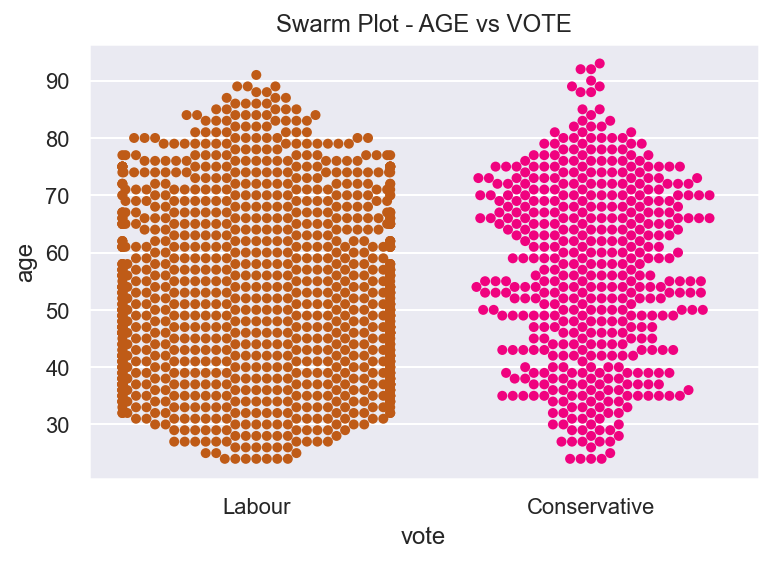

In [22]:
sns.swarmplot(df['vote'], df['age']);
plt.title('Swarm Plot - AGE vs VOTE');
plt.savefig('elec_swarm_age_vote.jpg', bbox_inches='tight');

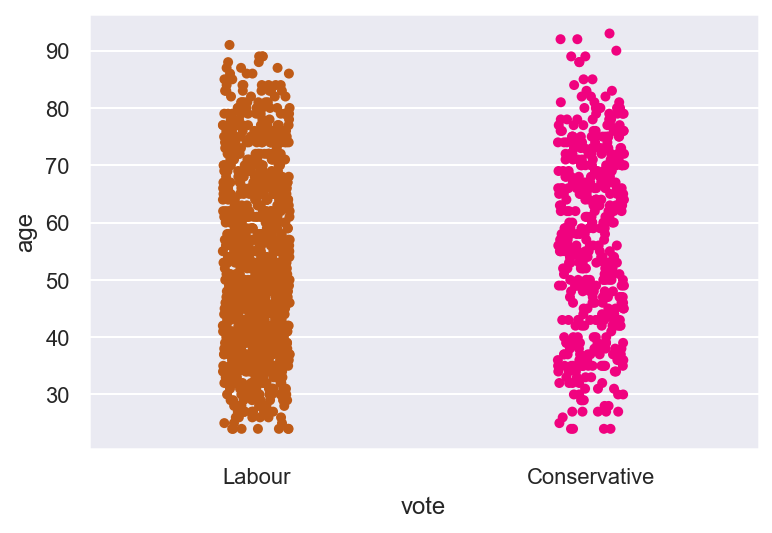

In [23]:
sns.stripplot(df['vote'], df['age']);

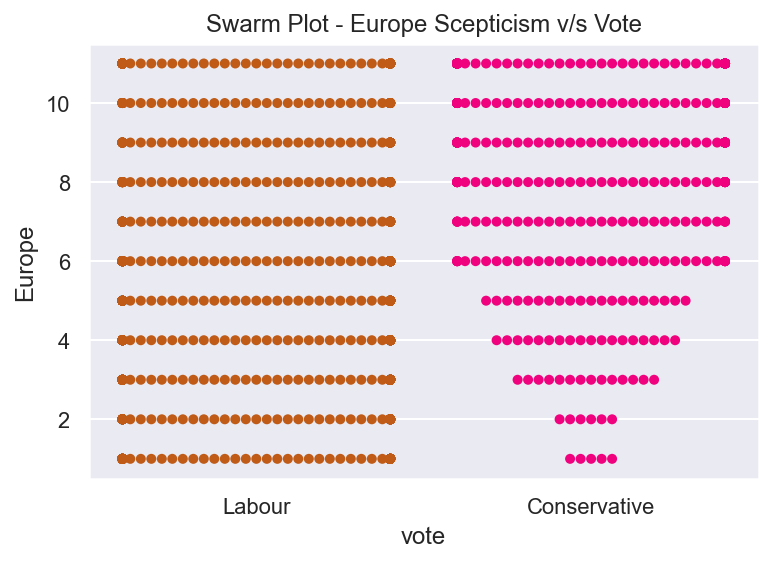

In [24]:
sns.swarmplot(df['vote'], df['Europe']);
plt.title('Swarm Plot - Europe Scepticism v/s Vote');
plt.savefig('elec_swarm_vote_europe.jpg', bbox_inches='tight');

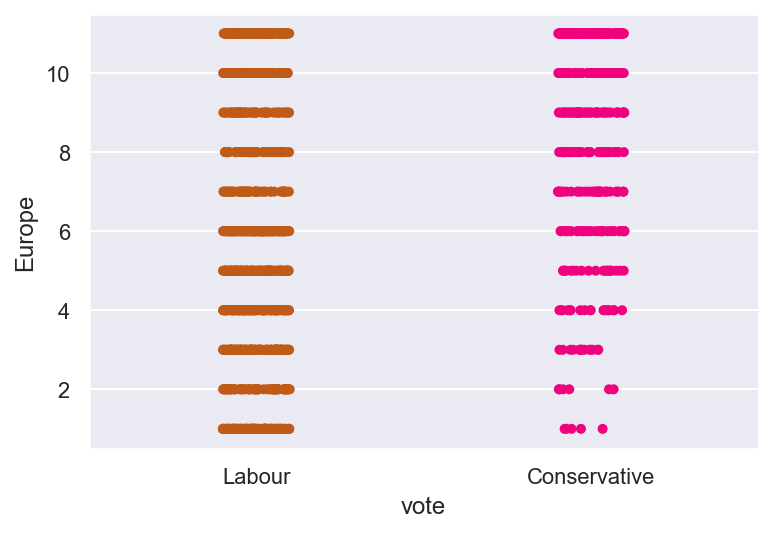

In [25]:
sns.stripplot(df['vote'], df['Europe']);

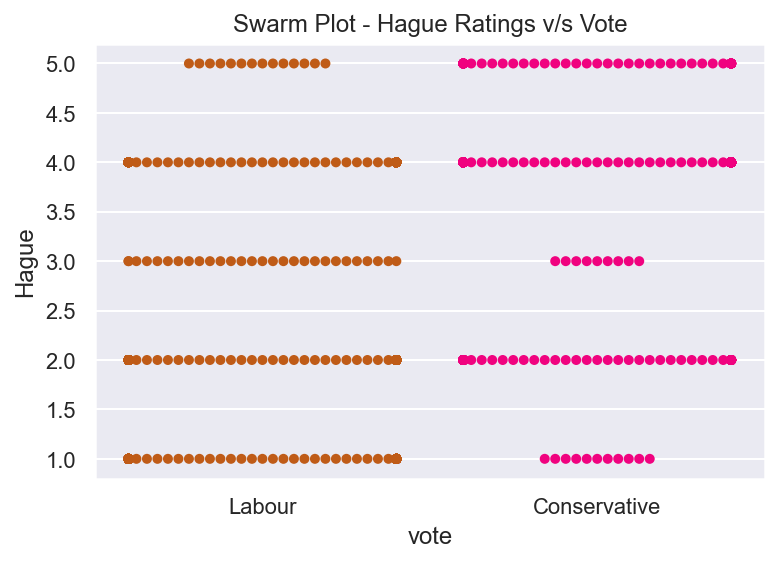

In [26]:
sns.swarmplot(df['vote'], df['Hague']);
plt.title('Swarm Plot - Hague Ratings v/s Vote');
plt.savefig('elec_swarm_vote_hague.jpg', bbox_inches='tight');

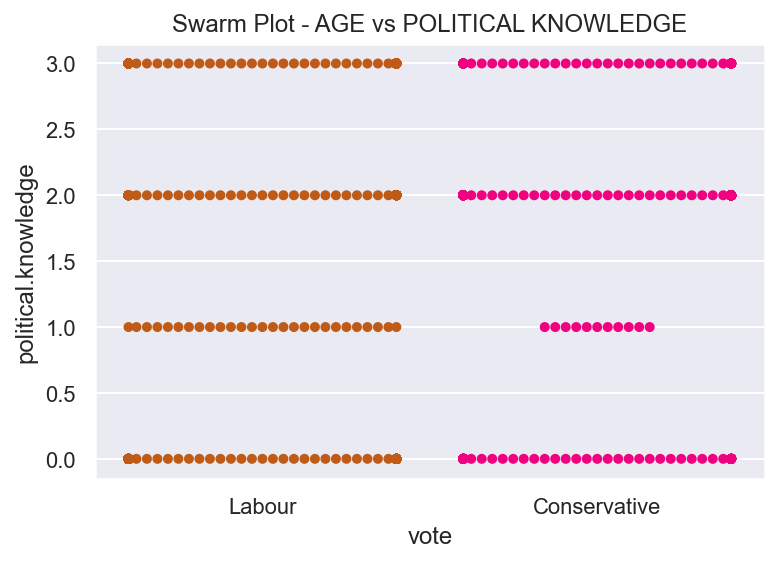

In [27]:
sns.swarmplot(df['vote'], df['political.knowledge']);
plt.title('Swarm Plot - AGE vs POLITICAL KNOWLEDGE');
plt.savefig('elec_swarm_POLITICAL_vote.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Count Plots

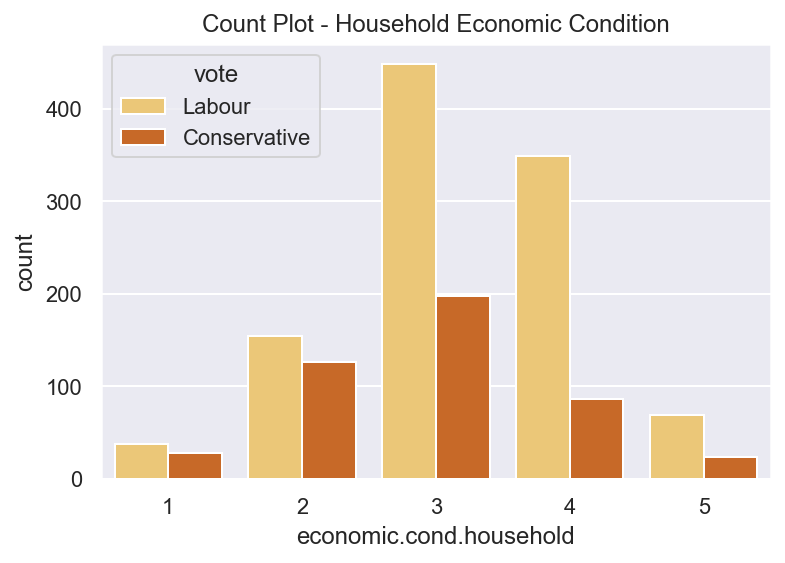

In [28]:
sns.countplot(df['economic.cond.household'], hue=df['vote'], palette='YlOrBr');
plt.title('Count Plot - Household Economic Condition');
plt.savefig('elec_count_house.jpg', bbox_inches='tight');

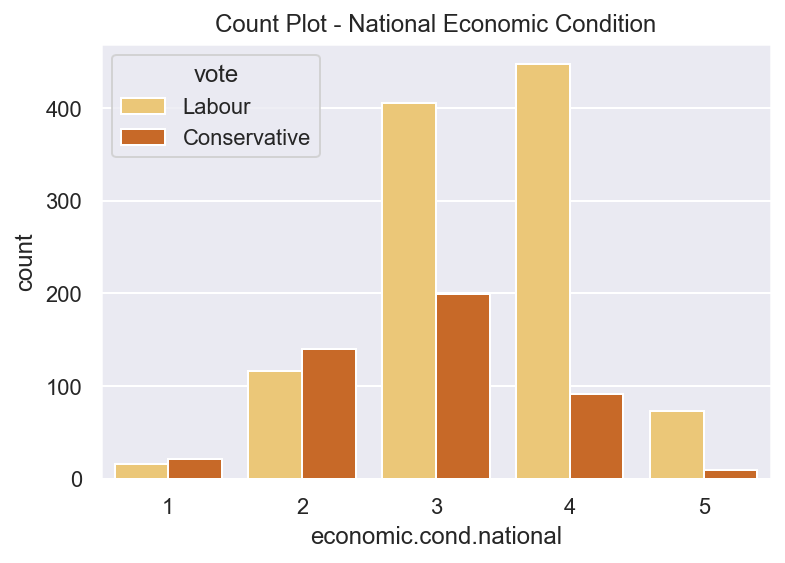

In [29]:
sns.countplot(df['economic.cond.national'], hue=df['vote'], palette='YlOrBr');
plt.title('Count Plot - National Economic Condition');
plt.savefig('elec_count_national.jpg', bbox_inches='tight');

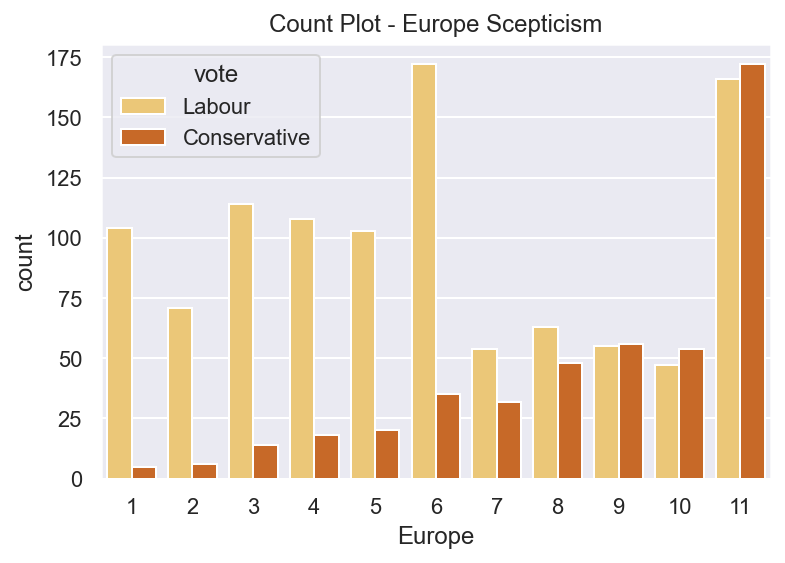

In [30]:
sns.countplot(df['Europe'], hue=df['vote'], palette='YlOrBr');
plt.title('Count Plot - Europe Scepticism');
plt.savefig('elec_count_europe.jpg', bbox_inches='tight');

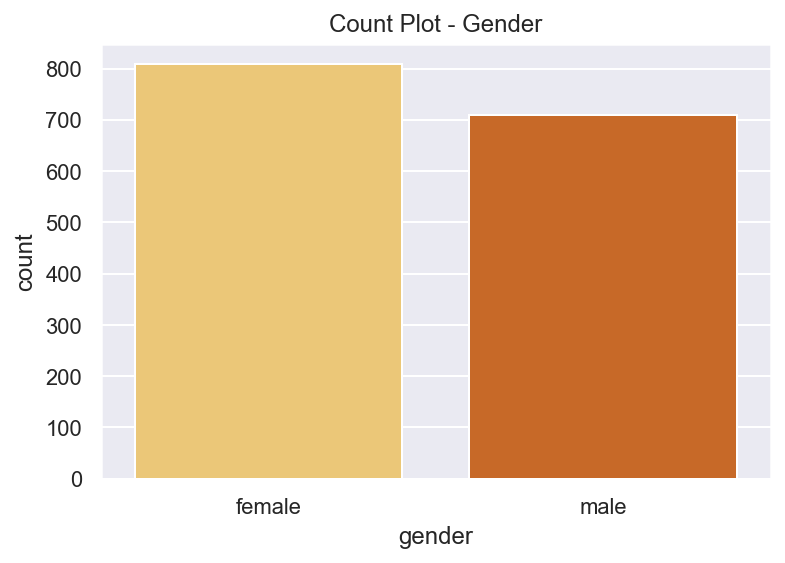

In [31]:
sns.countplot(df['gender'], palette='YlOrBr');
plt.title('Count Plot - Gender');
plt.savefig('elec_gender_count_nohue.jpg', bbox_inches='tight');

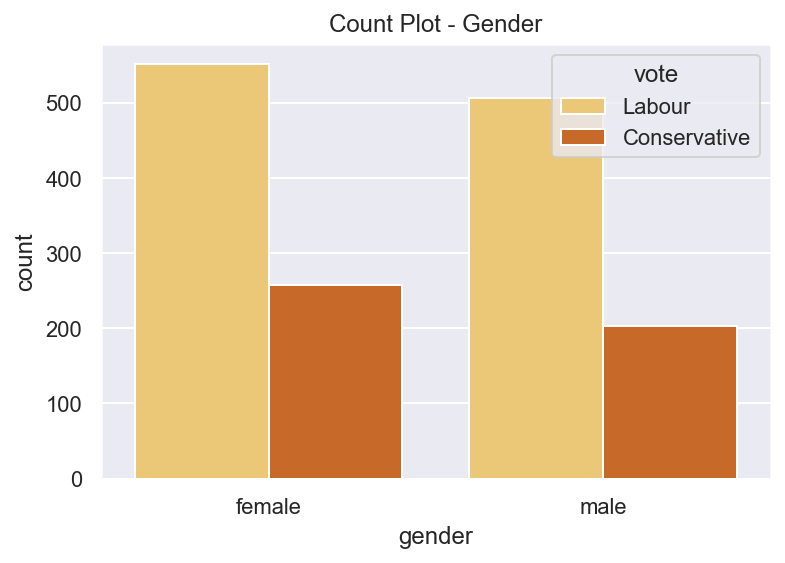

In [32]:
sns.countplot(df['gender'], palette='YlOrBr', hue=df['vote']);
plt.title('Count Plot - Gender');
plt.savefig('elec_gender_count_hue.jpg', bbox_inches='tight');

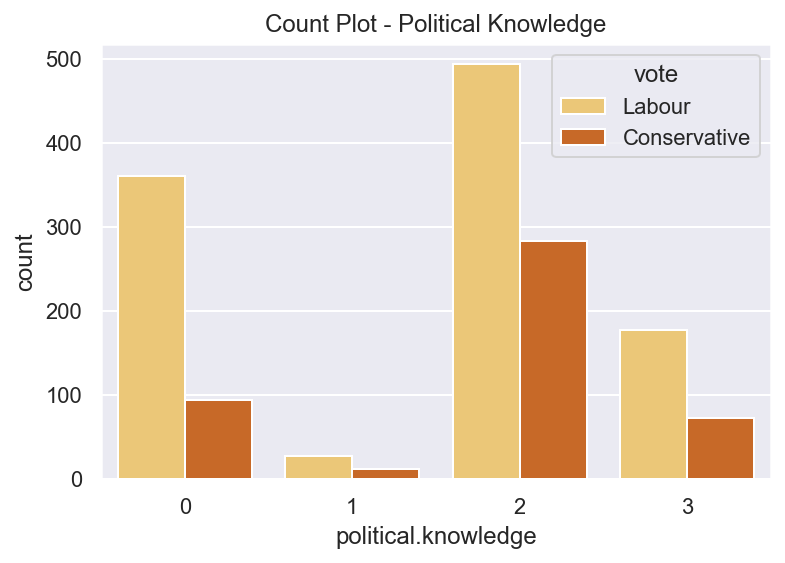

In [33]:
sns.countplot(df['political.knowledge'], hue=df['vote'], palette='YlOrBr');
plt.title('Count Plot - Political Knowledge');
plt.savefig('elec_count_political.jpg', bbox_inches='tight');

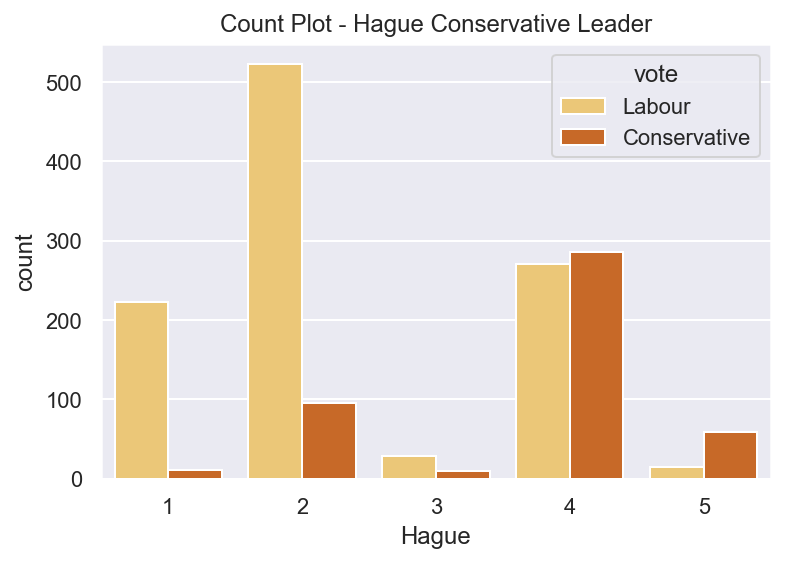

In [34]:
sns.countplot(df['Hague'], hue=df['vote'], palette='YlOrBr');
plt.title('Count Plot - Hague Conservative Leader');
plt.savefig('elec_count_hague.jpg', bbox_inches='tight');

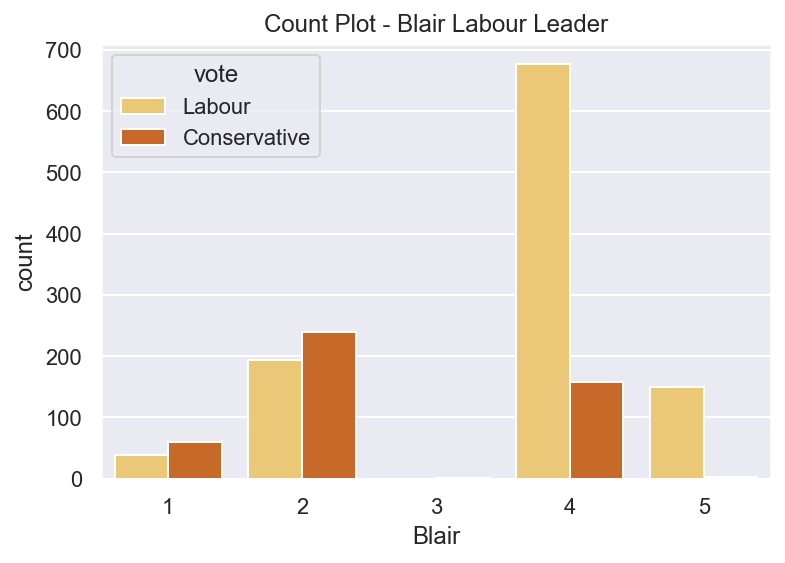

In [35]:
sns.countplot(df['Blair'], hue=df['vote'], palette='YlOrBr');
plt.title('Count Plot - Blair Labour Leader');
plt.savefig('elec_count_blair.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dependent Variable - 'vote' - Class Balance

In [36]:
df['vote'].value_counts()

Labour          1057
Conservative     460
Name: vote, dtype: int64

In [37]:
df['vote'].value_counts(normalize=True)

Labour          0.69677
Conservative    0.30323
Name: vote, dtype: float64

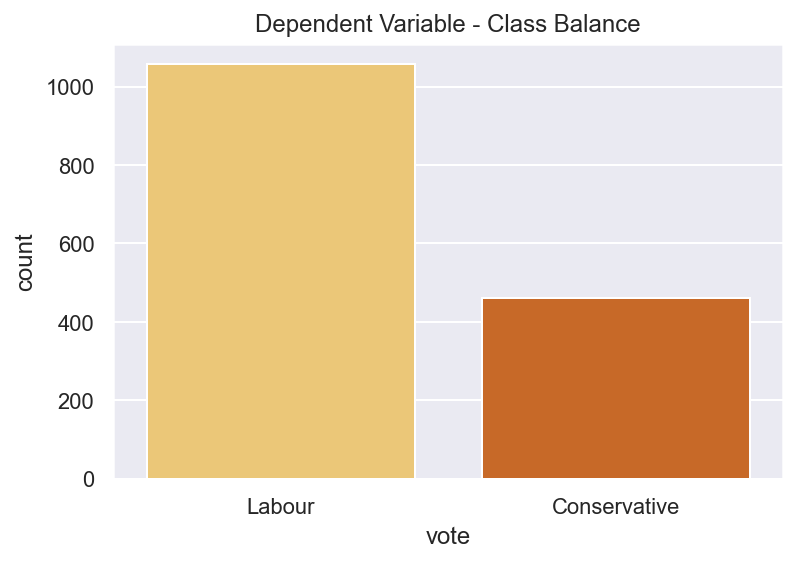

In [38]:
sns.countplot(df['vote'], palette='YlOrBr');
plt.title('Dependent Variable - Class Balance');
plt.savefig('elec_vote_count.jpg');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Pair Plot

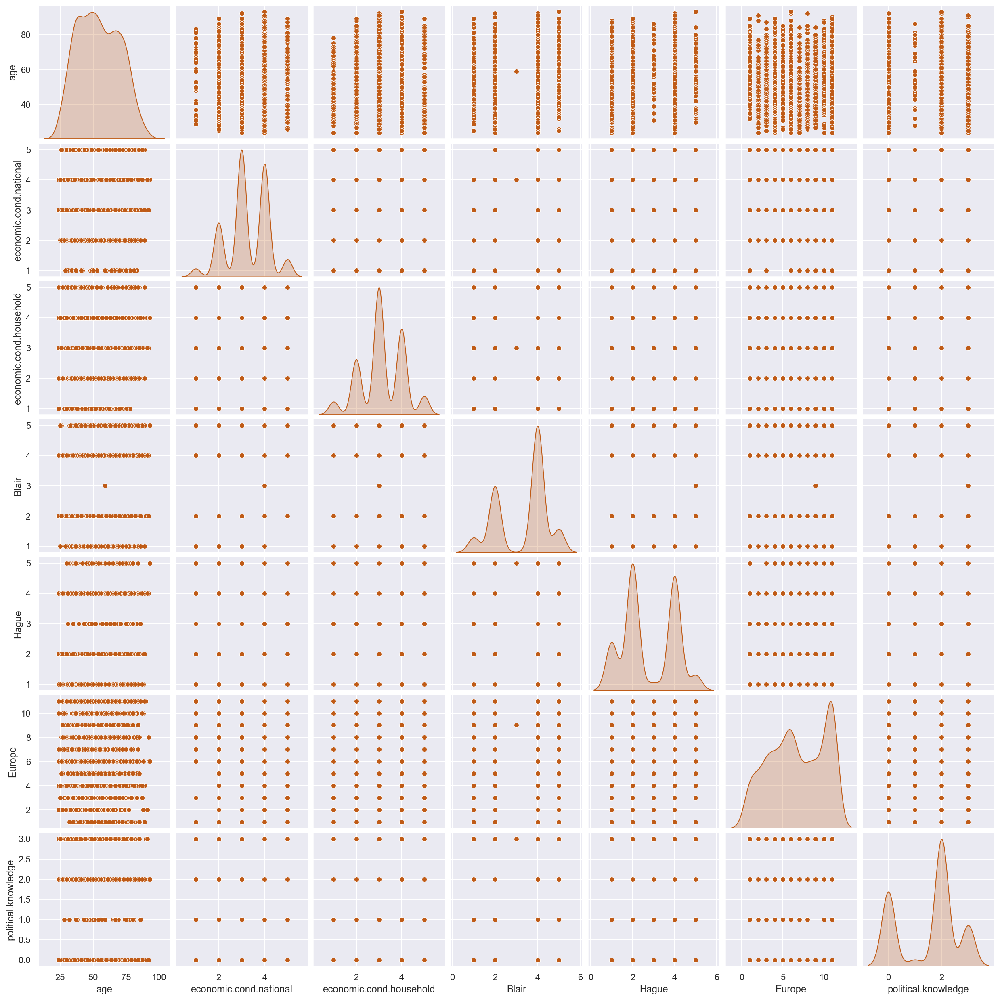

In [39]:

sns.pairplot(df, diag_kind='kde');

plt.savefig('elec_pairplot.jpg', bbox_inches='tight');


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Correlation Heatmap

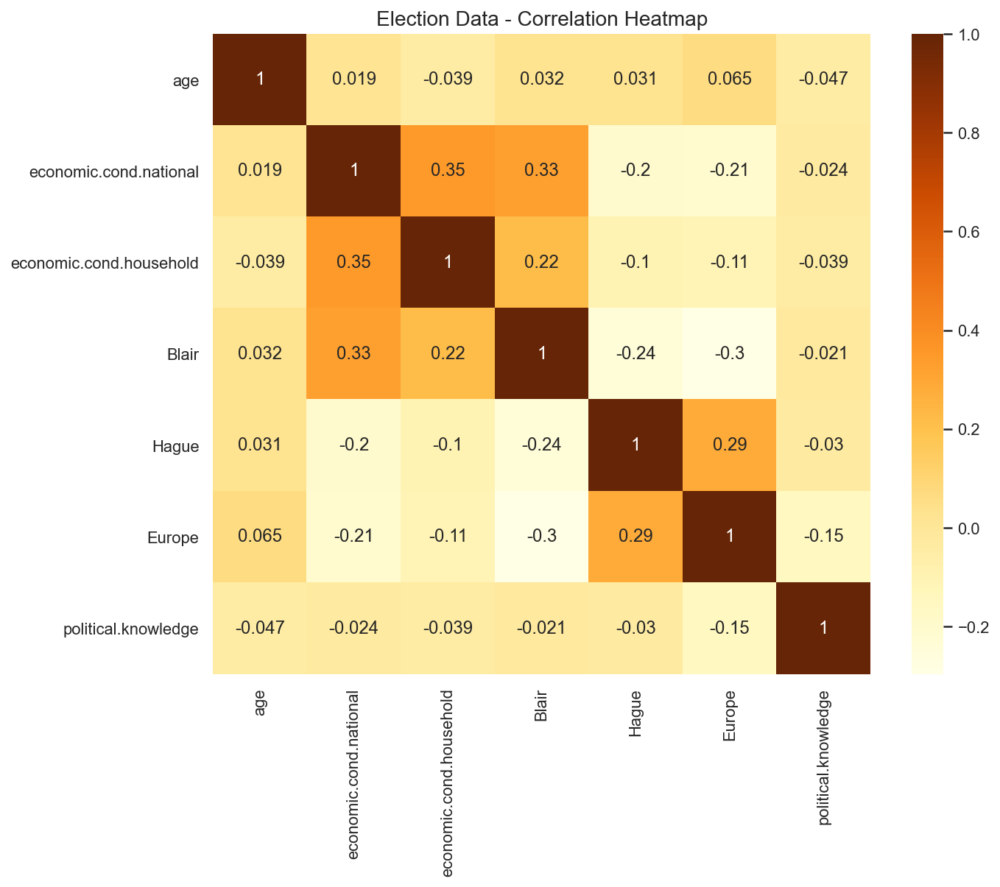

In [40]:
plt.figure(figsize=[10,8]);
plt.title('Election Data - Correlation Heatmap', size=14);
sns.heatmap(df.corr(), annot=True, fmt='.2g', cmap='YlOrBr');
plt.savefig('elec_corr.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Data Encoding

In [41]:
coded_df = df.copy()
for feature in coded_df.columns: 
    if coded_df[feature].dtype == 'object': 
        print('\n')
        print('feature:',feature)
        print(pd.Categorical(coded_df[feature].unique()))
        print(pd.Categorical(coded_df[feature].unique()).codes)
        coded_df[feature] = pd.Categorical(coded_df[feature]).codes



feature: vote
['Labour', 'Conservative']
Categories (2, object): ['Conservative', 'Labour']
[1 0]


feature: gender
['female', 'male']
Categories (2, object): ['female', 'male']
[0 1]


In [42]:
df.head()

,vote,age,economic.cond.national,economic.cond.household,Blair,Hague,Europe,political.knowledge,gender
0,Labour,43,3,3,4,1,2,2,female
1,Labour,36,4,4,4,4,5,2,male
2,Labour,35,4,4,5,2,3,2,male
3,Labour,24,4,2,2,1,4,0,female
4,Labour,41,2,2,1,1,6,2,male


In [43]:
coded_df.head()

,vote,age,economic.cond.national,economic.cond.household,Blair,Hague,Europe,political.knowledge,gender
0,1,43,3,3,4,1,2,2,0
1,1,36,4,4,4,4,5,2,1
2,1,35,4,4,5,2,3,2,1
3,1,24,4,2,2,1,4,0,0
4,1,41,2,2,1,1,6,2,1


<AxesSubplot:>

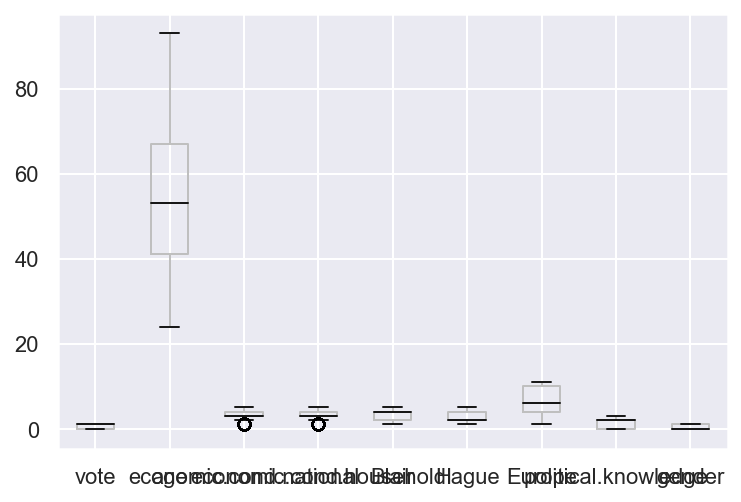

In [44]:
coded_df.boxplot()

* Labour - 1        ; Conservative - 0
* Male - 1          ; Female - 0

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Scaling

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> MinMax Scaled DF (Only age) - df_minmax

In [45]:
df_minmax = coded_df.copy()

minmax = MinMaxScaler()
df_age = coded_df['age']
df_age = pd.DataFrame(df_age, columns=['age'])

In [46]:
minmaxdf = minmax.fit_transform(df_age)

In [47]:
df_minmax['age'] = minmaxdf

In [48]:
df_minmax.head()

,vote,age,economic.cond.national,economic.cond.household,Blair,Hague,Europe,political.knowledge,gender
0,1,0.275362,3,3,4,1,2,2,0
1,1,0.173913,4,4,4,4,5,2,1
2,1,0.159420,4,4,5,2,3,2,1
3,1,0.000000,4,2,2,1,4,0,0
4,1,0.246377,2,2,1,1,6,2,1


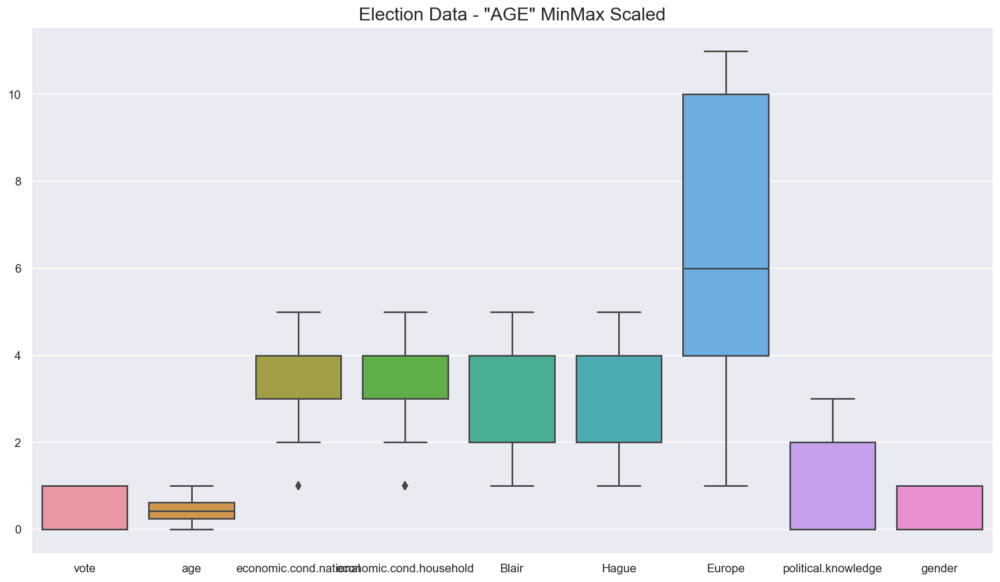

In [49]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=df_minmax);
plt.title('Election Data - "AGE" MinMax Scaled', fontsize=17);

plt.savefig('elec_minmax_scaled.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Standard Scaled DF (Only age) - df_stdsc

In [50]:
df_stdsc = coded_df.copy()

sc = StandardScaler()
df_age = coded_df['age']
df_age = pd.DataFrame(df_age, columns=['age'])

In [51]:
scdf = sc.fit_transform(df_age)

In [52]:
df_stdsc['age'] = scdf

In [53]:
df_stdsc.head()

,vote,age,economic.cond.national,economic.cond.household,Blair,Hague,Europe,political.knowledge,gender
0,1,-0.716161,3,3,4,1,2,2,0
1,1,-1.162118,4,4,4,4,5,2,1
2,1,-1.225827,4,4,5,2,3,2,1
3,1,-1.926617,4,2,2,1,4,0,0
4,1,-0.843577,2,2,1,1,6,2,1


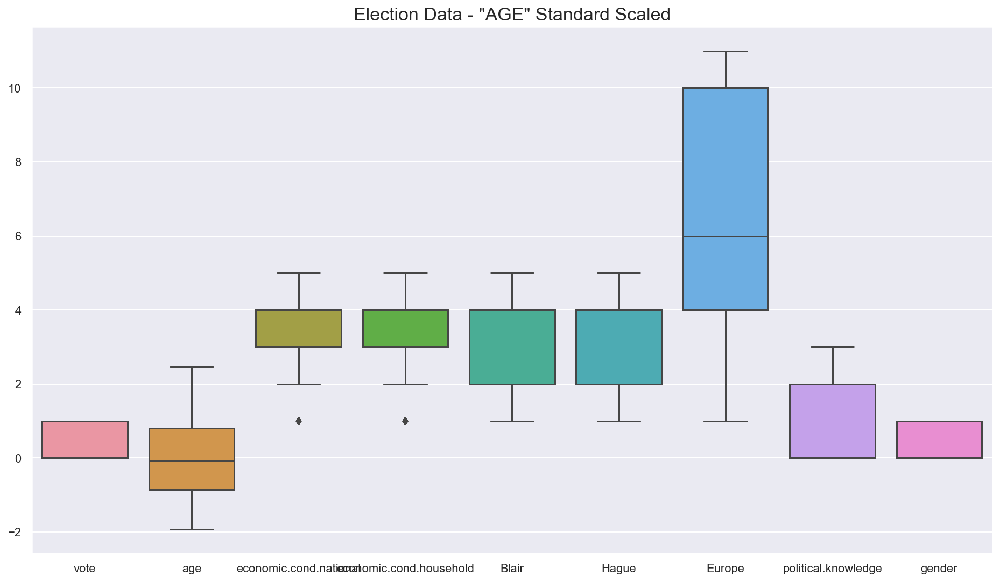

In [54]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=df_stdsc);
plt.title('Election Data - "AGE" Standard Scaled', fontsize=17);

plt.savefig('elec_standard_scaled.jpg', bbox_inches='tight');

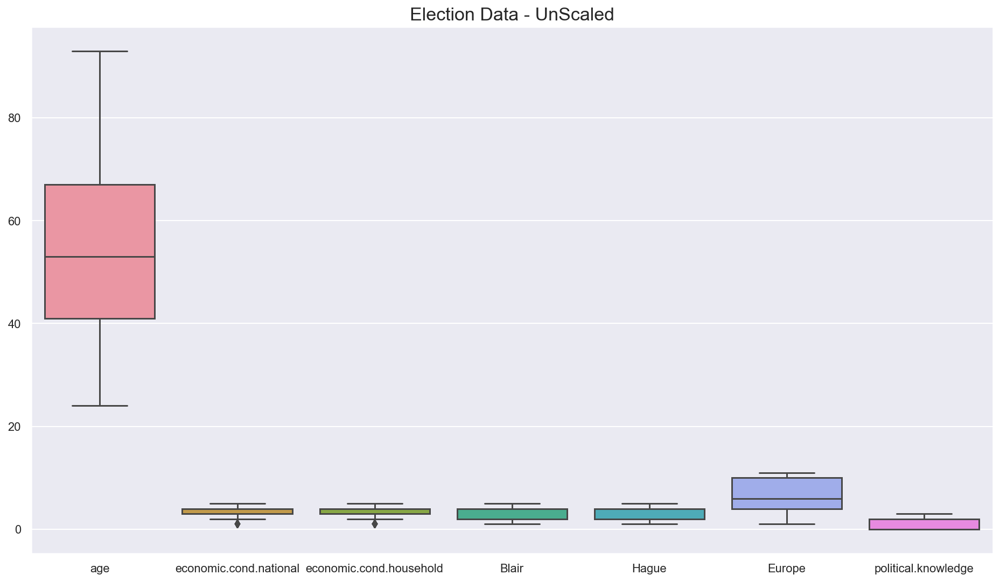

In [55]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=df);
plt.title('Election Data - UnScaled', fontsize=17);

plt.savefig('elec_unscaled.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Split The Data - MinMax Scaled

In [56]:
# Define Independent (X) and Dependent (y) variables

X_mm = df_minmax.drop('vote', axis=1)
y_mm = df_minmax['vote']

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Split The Data - Standard Scaled

In [57]:
# Define Independent (X) and Dependent (y) variables

X_sc = df_stdsc.drop('vote', axis=1)
y_sc = df_stdsc['vote']

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#D86969"> Naive Bayes

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Naive Bayes - MinMax Scaled of Only 'age'

In [58]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [59]:
X_train.shape
X_mm.shape

(1061, 8)

(1517, 8)

In [60]:
X_test.shape

(456, 8)

In [61]:
gnb2 = GaussianNB()
gnb2.fit(X_train, y_train)

GaussianNB()

In [62]:
gnb2_train_score = gnb2.score(X_train, y_train)
gnb2_test_score = gnb2.score(X_test, y_test)
gnb2_test_f1 = metrics.f1_score(y_test, gnb2.predict(X_test))
gnb2_test_f0 = metrics.f1_score(y_test, gnb2.predict(X_test), pos_label=0)

print('Naive Bayes Train Score =', round(gnb2_train_score, 4))
print('Naive Bayes Test Score =', round(gnb2_test_score, 4))
print('Naive Bayes f1 Test Score for "Labour" =', round(gnb2_test_f1, 4))
print('Naive Bayes f1 Test Score for "Conservative" =', round(gnb2_test_f0, 4))

Naive Bayes Train Score = 0.8351
Naive Bayes Test Score = 0.8158
Naive Bayes f1 Test Score for "Labour" = 0.8692
Naive Bayes f1 Test Score for "Conservative" = 0.6889


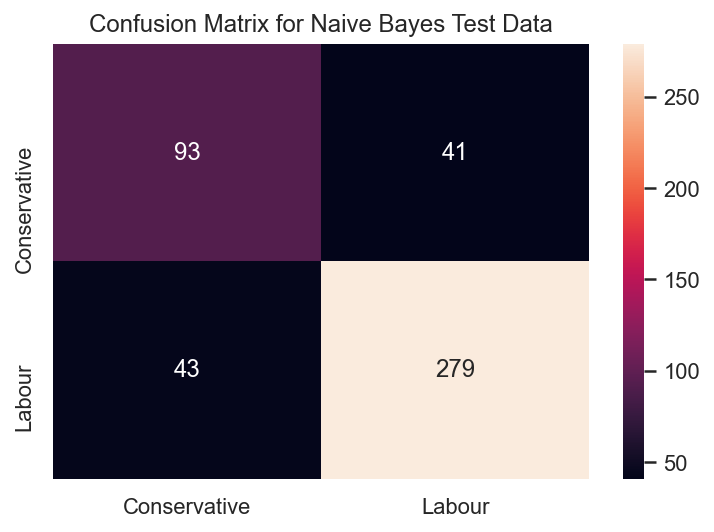

In [63]:
sns.heatmap(confusion_matrix(y_test, gnb2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Naive Bayes Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Naive Bayes - Standard Scaling of Only 'age'

In [64]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [65]:
gnb3 = GaussianNB()
gnb3.fit(X_train, y_train)

GaussianNB()

In [66]:
gnb3_train_score = gnb3.score(X_train, y_train)
gnb3_test_score = gnb3.score(X_test, y_test)
gnb3_test_f1 = metrics.f1_score(y_test, gnb3.predict(X_test))
gnb3_test_f0 = metrics.f1_score(y_test, gnb3.predict(X_test), pos_label=0)

print('Naive Bayes Train Score =', round(gnb3_train_score, 4))
print('Naive Bayes Test Score =', round(gnb3_test_score, 4))
print('Naive Bayes f1 Test Score for "Labour" =', round(gnb3_test_f1, 4))
print('Naive Bayes f1 Test Score for "Conservative" =', round(gnb3_test_f0, 4))

Naive Bayes Train Score = 0.8351
Naive Bayes Test Score = 0.8158
Naive Bayes f1 Test Score for "Labour" = 0.8692
Naive Bayes f1 Test Score for "Conservative" = 0.6889


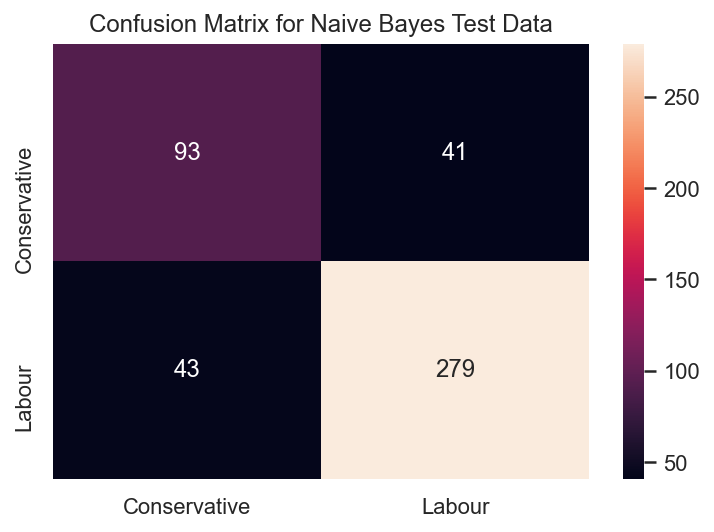

In [67]:
sns.heatmap(confusion_matrix(y_test, gnb3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Naive Bayes Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Naive Bayes - Fine Tuning by Adjusting Threshold

In [68]:
probs = gnb3.predict_proba(X_train)
for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(probs[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
#     plt.figure(figsize=(6,4));
#     print('Confusion Matrix')
#     sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
#     plt.show();

0.1 

Accuracy Score = 0.7729
0.2 

Accuracy Score = 0.8068
0.3 

Accuracy Score = 0.8228
0.4 

Accuracy Score = 0.8369
0.5 

Accuracy Score = 0.8351
0.6 

Accuracy Score = 0.8256
0.7 

Accuracy Score = 0.8209
0.8 

Accuracy Score = 0.8011
0.9 

Accuracy Score = 0.7436


### Best Threshold for Naive Bayes = 0.4

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Naive Bayes - Finding New Scores for Threshold 0.4

In [69]:
gnb4 = GaussianNB()
gnb4.fit(X_train, y_train)

GaussianNB()

In [70]:
test_cutoff = []
train_cutoff = []
probs_tr = gnb4.predict_proba(X_train)
probs_te = gnb4.predict_proba(X_test)

for i in range(0,len(y_test)):#defining a loop for the length of the test data
        if np.array(probs_te[:,1])[i] > 0.4:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        test_cutoff.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us

for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(probs_tr[:,1])[i] > 0.4:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        train_cutoff.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
        
        

In [71]:
gnb4_train_score = metrics.accuracy_score(y_train,train_cutoff)
gnb4_test_score = metrics.accuracy_score(y_test,test_cutoff)
gnb4_test_f1 = metrics.f1_score(y_test, test_cutoff)
gnb4_test_f0 = metrics.f1_score(y_test, test_cutoff, pos_label=0)

print('Naive Bayes Train Score =', round(gnb4_train_score, 4))
print('Naive Bayes Test Score =', round(gnb4_test_score, 4))
print('Naive Bayes f1 Test Score for "Labour" =', round(gnb4_test_f1, 4))
print('Naive Bayes f1 Test Score for "Conservative" =', round(gnb4_test_f0, 4))

Naive Bayes Train Score = 0.8369
Naive Bayes Test Score = 0.8224
Naive Bayes f1 Test Score for "Labour" = 0.8767
Naive Bayes f1 Test Score for "Conservative" = 0.6824


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#00B1C6"> Logistic Regression

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Logistic Regression - MinMax Scaled of Only 'age'

In [72]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [73]:
y_train.value_counts(normalize=True)

1    0.692743
0    0.307257
Name: vote, dtype: float64

In [74]:
y_test.value_counts(normalize=True)

1    0.70614
0    0.29386
Name: vote, dtype: float64

In [75]:
logit2 = LogisticRegression()
logit2.fit(X_train, y_train)

LogisticRegression()

In [76]:
logit2_train_score = logit2.score(X_train, y_train)
logit2_test_score = logit2.score(X_test, y_test)
logit2_test_f1 = metrics.f1_score(y_test, logit2.predict(X_test))
logit2_test_f0 = metrics.f1_score(y_test, logit2.predict(X_test), pos_label=0)

print('Logistic Regression Train Score =', round(logit2_train_score, 4))
print('Logistic Regression Test Score =', round(logit2_test_score, 4))
print('Logistic Regression f1 Test Score for "Labour" =', round(logit2_test_f1, 4))
print('Logistic Regression f1 Test Score for "Conservative" =', round(logit2_test_f0, 4))

Logistic Regression Train Score = 0.8435
Logistic Regression Test Score = 0.8224
Logistic Regression f1 Test Score for "Labour" = 0.8778
Logistic Regression f1 Test Score for "Conservative" = 0.6747


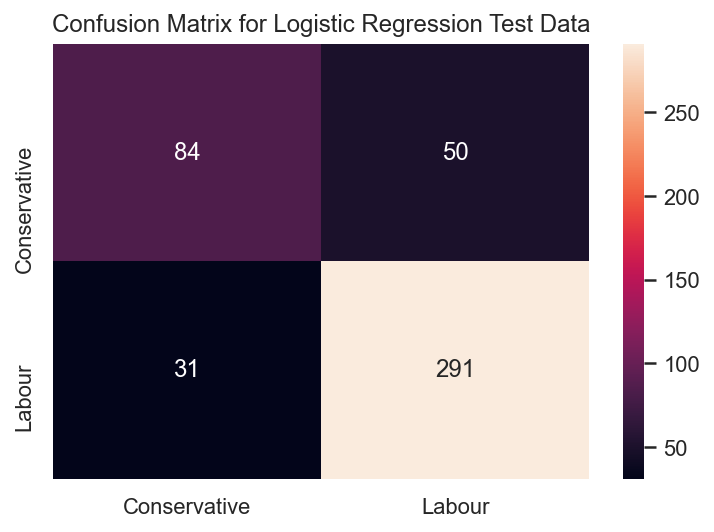

In [77]:
sns.heatmap(confusion_matrix(y_test, logit2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Logistic Regression Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Logistic Regression - Standard Scaling of Only 'age'

In [78]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [79]:
logit3 = LogisticRegression()
logit3.fit(X_train, y_train)

LogisticRegression()

In [80]:
logit3_train_score = logit3.score(X_train, y_train)
logit3_test_score = logit3.score(X_test, y_test)
logit3_test_f1 = metrics.f1_score(y_test, logit3.predict(X_test))
logit3_test_f0 = metrics.f1_score(y_test, logit3.predict(X_test), pos_label=0)

print('Logistic Regression Train Score =', round(logit3_train_score, 4))
print('Logistic Regression Test Score =', round(logit3_test_score, 4))
print('Logistic Regression f1 Test Score for "Labour" =', round(logit3_test_f1, 4))
print('Logistic Regression f1 Test Score for "Conservative" =', round(logit3_test_f0, 4))

Logistic Regression Train Score = 0.8435
Logistic Regression Test Score = 0.8202
Logistic Regression f1 Test Score for "Labour" = 0.8765
Logistic Regression f1 Test Score for "Conservative" = 0.6694


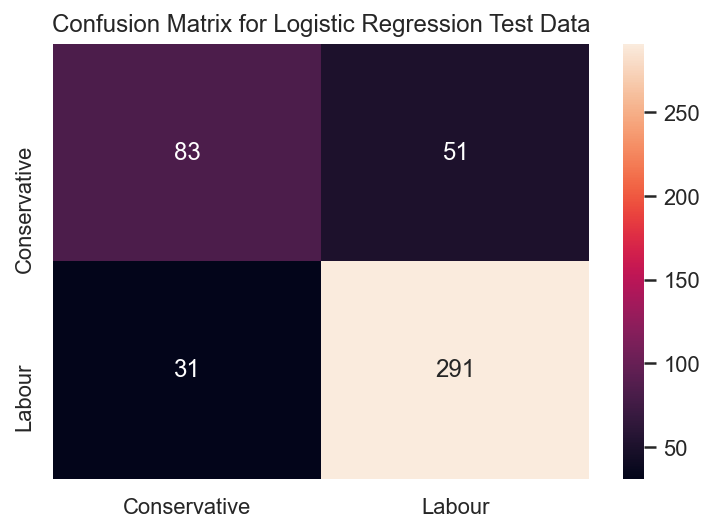

In [81]:
sns.heatmap(confusion_matrix(y_test, logit3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Logistic Regression Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Logistic Regression - Fine Tuning by using GridSearchCV

In [82]:
grid={'penalty':['l2','none', 'l1'],
      'solver':['lbfgs', 'liblinear', 'sag', 'saga', 'newton-cg'],
      'tol':[0.0001,0.00001]}

In [83]:
model = LogisticRegression(max_iter=10000,n_jobs=2)

In [84]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 10,n_jobs=-1,scoring='f1', verbose=True)

In [85]:
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    9.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    9.4s finished


GridSearchCV(cv=10, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none', 'l1'],
                         'solver': ['lbfgs', 'liblinear', 'sag', 'saga',
                                    'newton-cg'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1', verbose=True)

In [86]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l1', 'solver': 'saga', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=2, penalty='l1', solver='saga')


In [87]:
best_model = grid_search.best_estimator_

In [88]:
logit4_train_score = best_model.score(X_train, y_train)
logit4_test_score = best_model.score(X_test, y_test)
logit4_test_f1 = metrics.f1_score(y_test, best_model.predict(X_test))
logit4_test_f0 = metrics.f1_score(y_test, best_model.predict(X_test), pos_label=0)

print('Regularised Logistic Regression Train Score =', round(logit4_train_score, 4))
print('Regularised Logistic Regression Test Score =', round(logit4_test_score, 4))
print('Regularised Logistic Regression f1 Test Score for "Labour" =', round(logit4_test_f1, 4))
print('Regularised Logistic Regression f1 Test Score for "Conservative" =', round(logit4_test_f0, 4))

Regularised Logistic Regression Train Score = 0.8435
Regularised Logistic Regression Test Score = 0.8202
Regularised Logistic Regression f1 Test Score for "Labour" = 0.8765
Regularised Logistic Regression f1 Test Score for "Conservative" = 0.6694


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Logistic Regression - Fine Tuning by Adjusting Threshold

0.1 

Accuracy Score = 0.7361


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

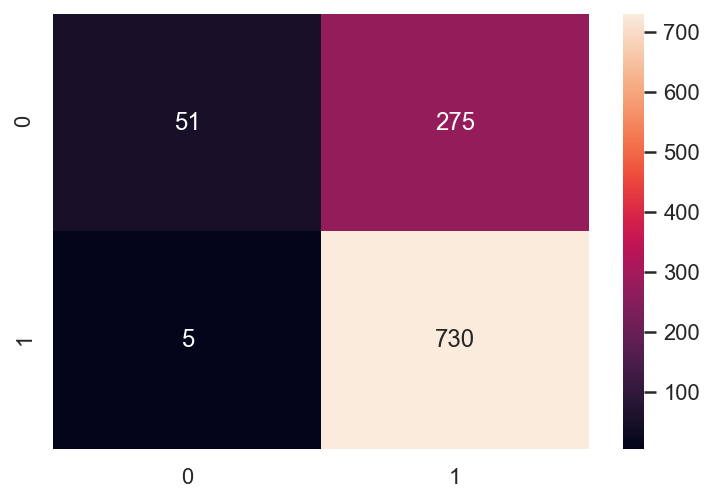

0.2 

Accuracy Score = 0.7747


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

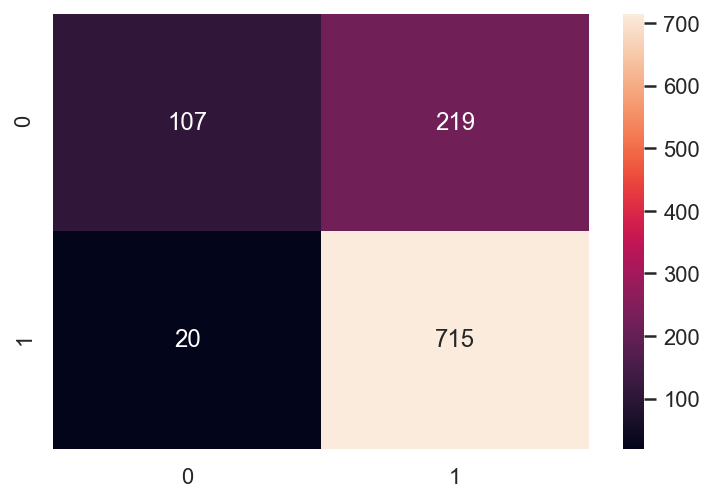

0.3 

Accuracy Score = 0.7974


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

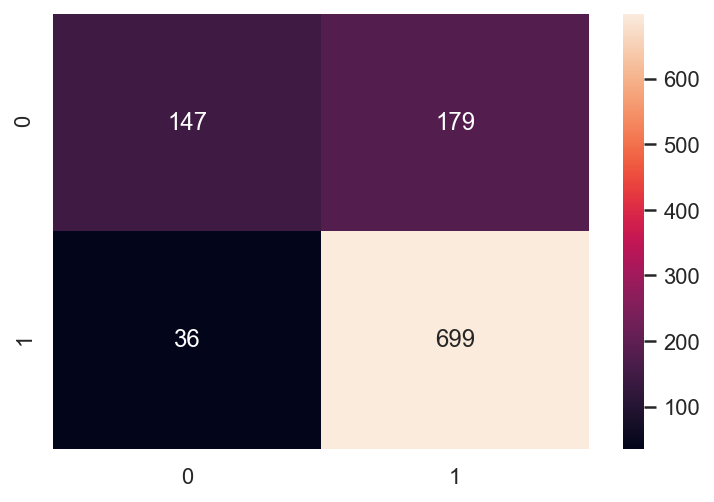

0.4 

Accuracy Score = 0.8313


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

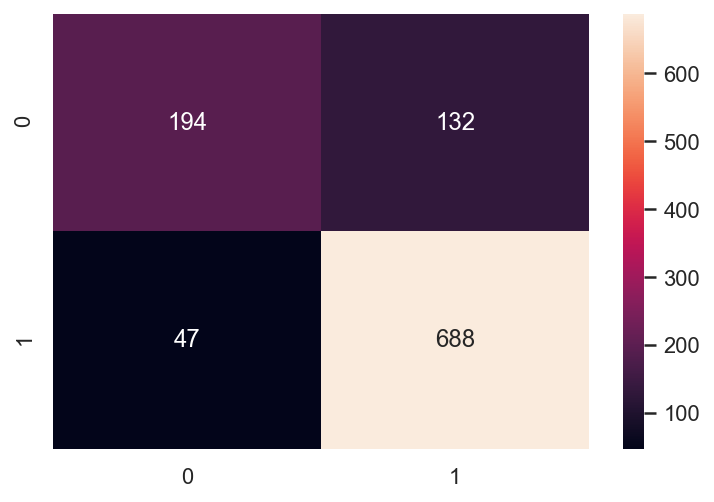

0.5 

Accuracy Score = 0.8435


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

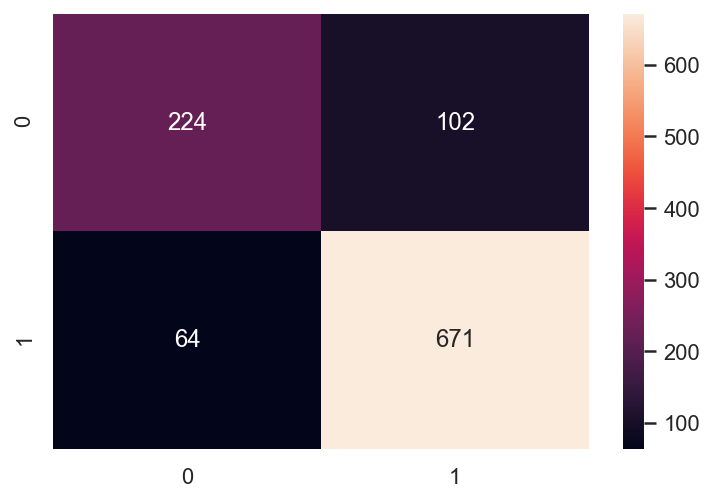

0.6 

Accuracy Score = 0.8388


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

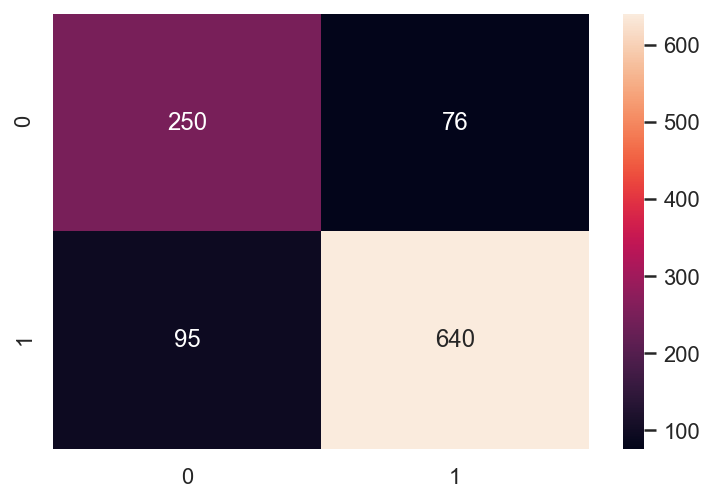

0.7 

Accuracy Score = 0.8219


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

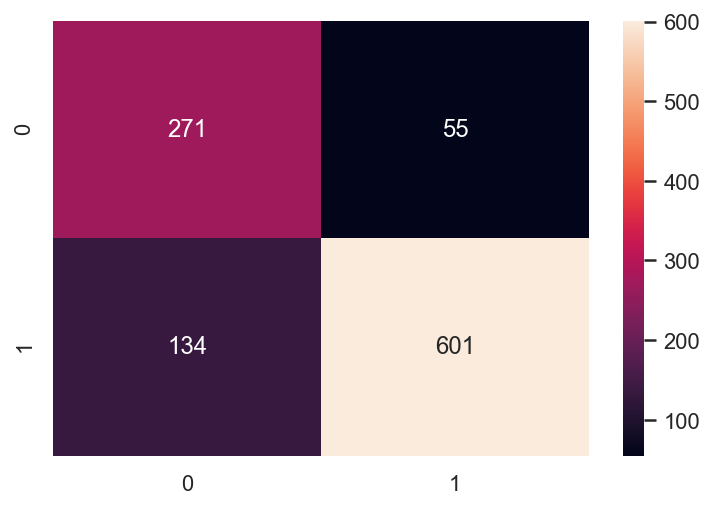

0.8 

Accuracy Score = 0.7757


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

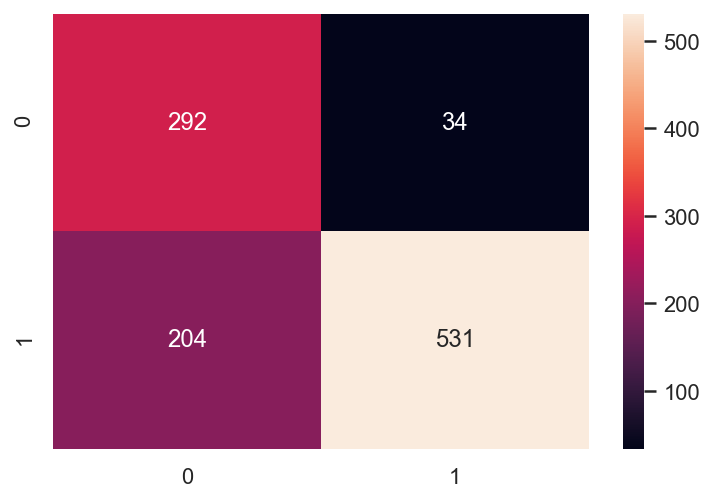

0.9 

Accuracy Score = 0.6758


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

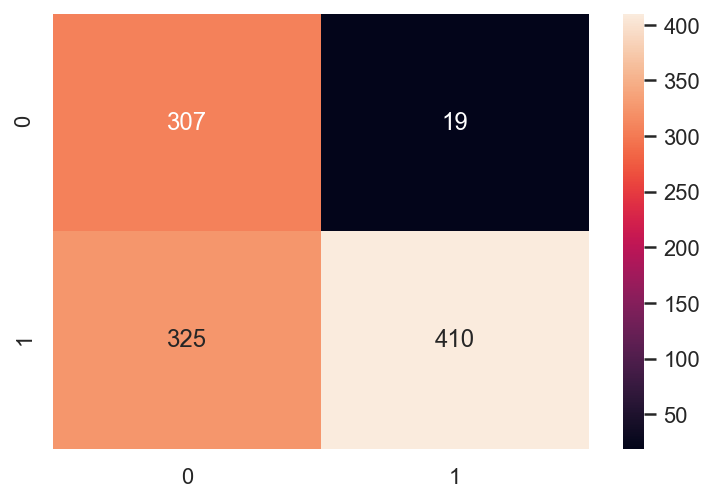

In [89]:
for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(logit3.predict_proba(X_train)[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
    plt.figure(figsize=(6,4));
    print('Confusion Matrix')
    sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
    plt.show();

### Best Threshold for Logistic Regression = 0.5

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#D86969"> Linear Discriminant Analysis (LDA)

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> LDA - MinMax Scaled of Only 'age'

In [90]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [91]:
lda2 = LinearDiscriminantAnalysis()
lda2.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [92]:
lda2_train_score = lda2.score(X_train, y_train)
lda2_test_score = lda2.score(X_test, y_test)
lda2_test_f1 = metrics.f1_score(y_test, lda2.predict(X_test))
lda2_test_f0 = metrics.f1_score(y_test, lda2.predict(X_test), pos_label=0)

print('LDA Train Score =', round(lda2_train_score, 4))
print('LDA Test Score =', round(lda2_test_score, 4))
print('LDA f1 Test Score for "Labour" =', round(lda2_test_f1, 4))
print('LDA f1 Test Score for "Conservative" =', round(lda2_test_f0, 4))

LDA Train Score = 0.8464
LDA Test Score = 0.8224
LDA f1 Test Score for "Labour" = 0.8763
LDA f1 Test Score for "Conservative" = 0.6848


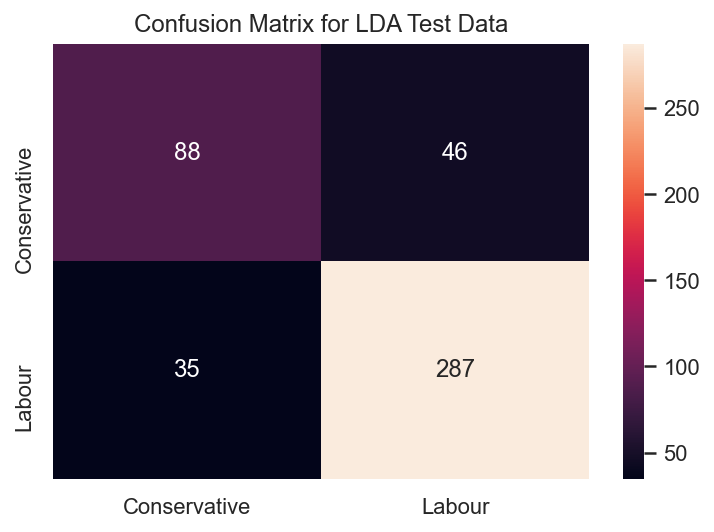

In [93]:
sns.heatmap(confusion_matrix(y_test, lda2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for LDA Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> LDA - Standard Scaling of Only 'age'

In [94]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [95]:
lda3 = LinearDiscriminantAnalysis()
lda3.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [96]:
lda3_train_score = lda3.score(X_train, y_train)
lda3_test_score = lda3.score(X_test, y_test)
lda3_test_f1 = metrics.f1_score(y_test, lda3.predict(X_test))
lda3_test_f0 = metrics.f1_score(y_test, lda3.predict(X_test), pos_label=0)

print('LDA Train Score =', round(lda3_train_score, 4))
print('LDA Test Score =', round(lda3_test_score, 4))
print('LDA f1 Test Score for "Labour" =', round(lda3_test_f1, 4))
print('LDA f1 Test Score for "Conservative" =', round(lda3_test_f0, 4))

LDA Train Score = 0.8464
LDA Test Score = 0.8224
LDA f1 Test Score for "Labour" = 0.8763
LDA f1 Test Score for "Conservative" = 0.6848


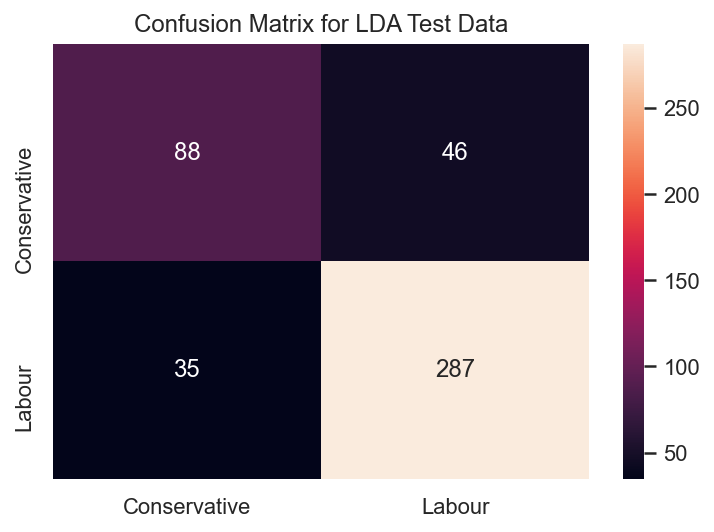

In [97]:
sns.heatmap(confusion_matrix(y_test, lda3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for LDA Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> LDA - Fine Tuning by Adjusting Threshold

0.1 

Accuracy Score = 0.7502


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

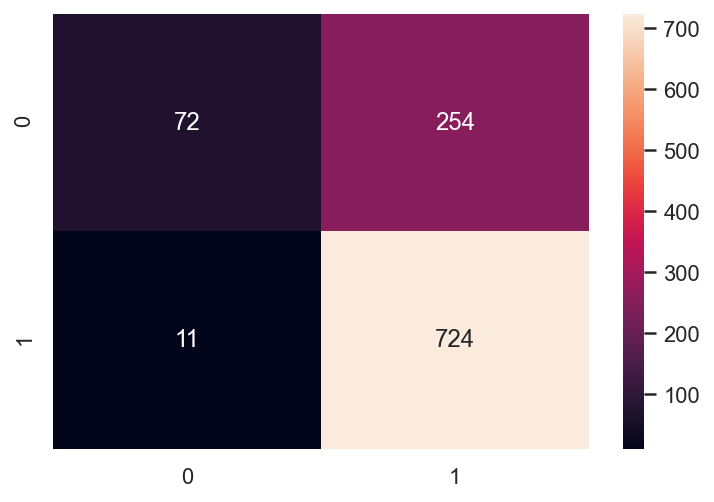

0.2 

Accuracy Score = 0.7832


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

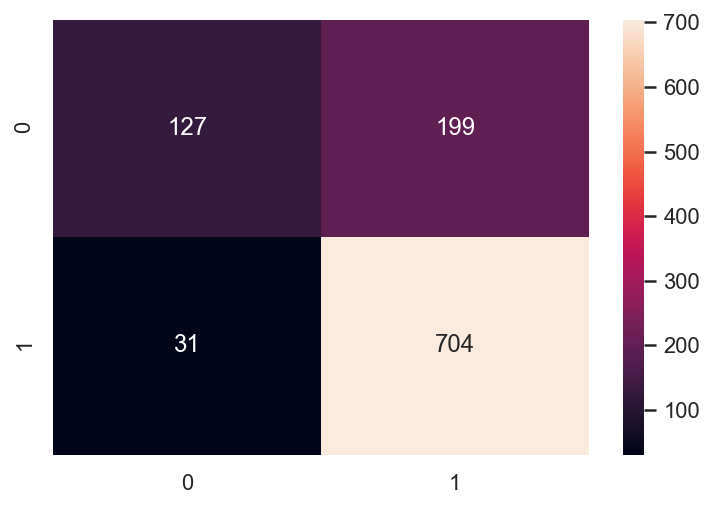

0.3 

Accuracy Score = 0.8143


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

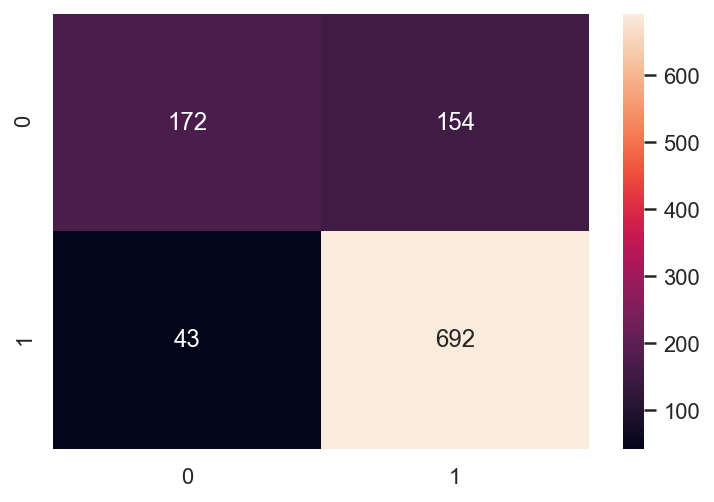

0.4 

Accuracy Score = 0.836


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

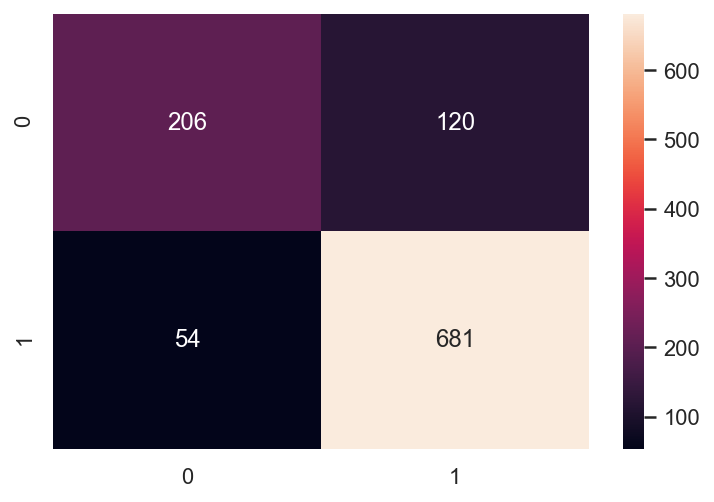

0.5 

Accuracy Score = 0.8464


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

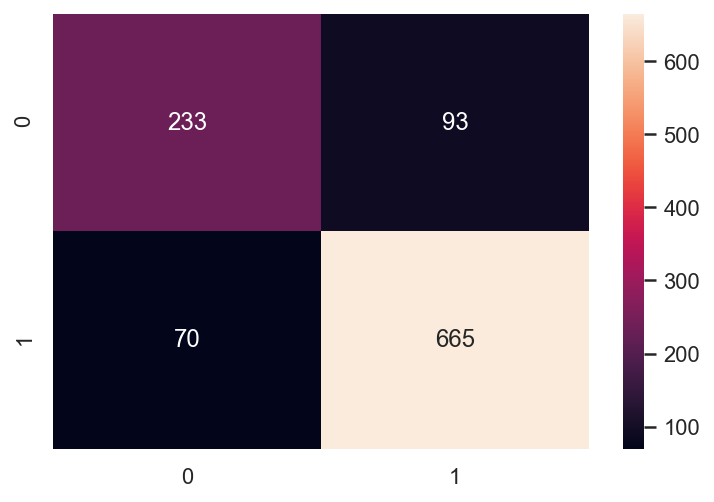

0.6 

Accuracy Score = 0.8341


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

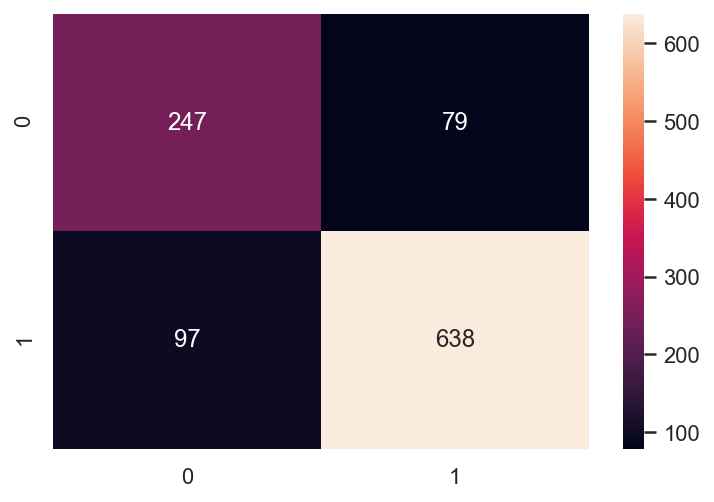

0.7 

Accuracy Score = 0.8228


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

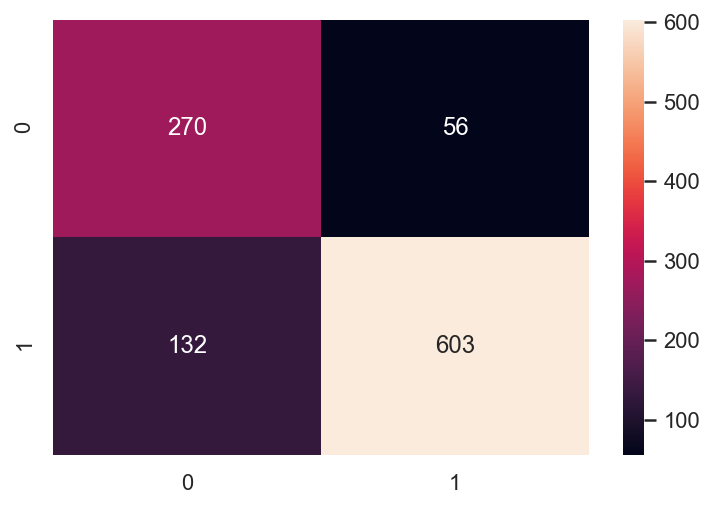

0.8 

Accuracy Score = 0.7861


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

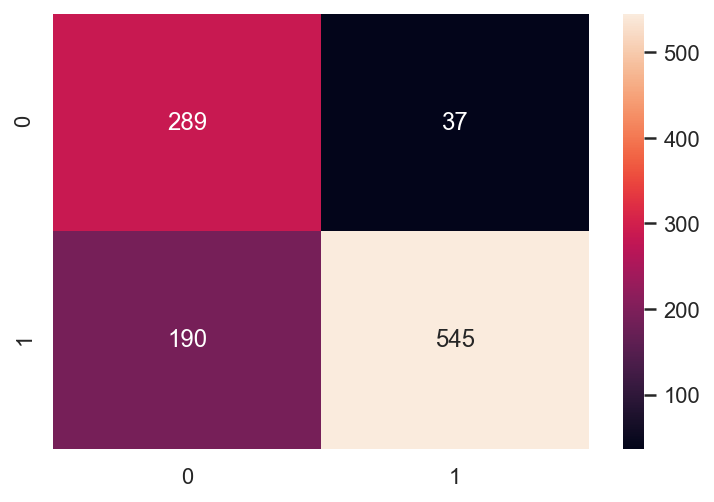

0.9 

Accuracy Score = 0.7116


<Figure size 432x288 with 0 Axes>

Confusion Matrix


<AxesSubplot:>

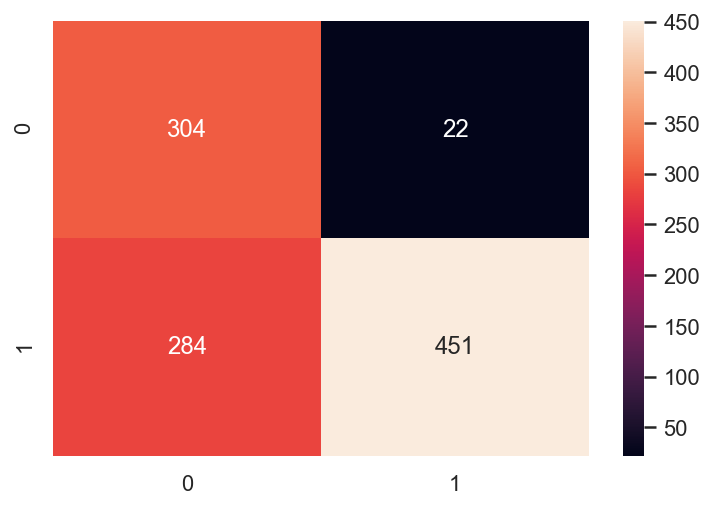

In [98]:
for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(lda3.predict_proba(X_train)[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
    plt.figure(figsize=(6,4));
    print('Confusion Matrix')
    sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
    plt.show();

### Best Threshold for LDA = 0.5

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#00B1C6"> K-Nearest Neighbour (KNN)

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> KNN - MinMax Scaled of Only 'age'

In [99]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [100]:
knn2 = KNeighborsClassifier()
knn2.fit(X_train, y_train)

KNeighborsClassifier()

In [101]:
knn2_train_score = knn2.score(X_train, y_train)
knn2_test_score = knn2.score(X_test, y_test)
knn2_test_f1 = metrics.f1_score(y_test, knn2.predict(X_test))
knn2_test_f0 = metrics.f1_score(y_test, knn2.predict(X_test), pos_label=0)

print('KNN Train Score =', round(knn2_train_score, 4))
print('KNN Test Score =', round(knn2_test_score, 4))
print('KNN f1 Test Score for "Labour" =', round(knn2_test_f1, 4))
print('KNN f1 Test Score for "Conservative" =', round(knn2_test_f0, 4))

KNN Train Score = 0.8709
KNN Test Score = 0.8202
KNN f1 Test Score for "Labour" = 0.8723
KNN f1 Test Score for "Conservative" = 0.6963


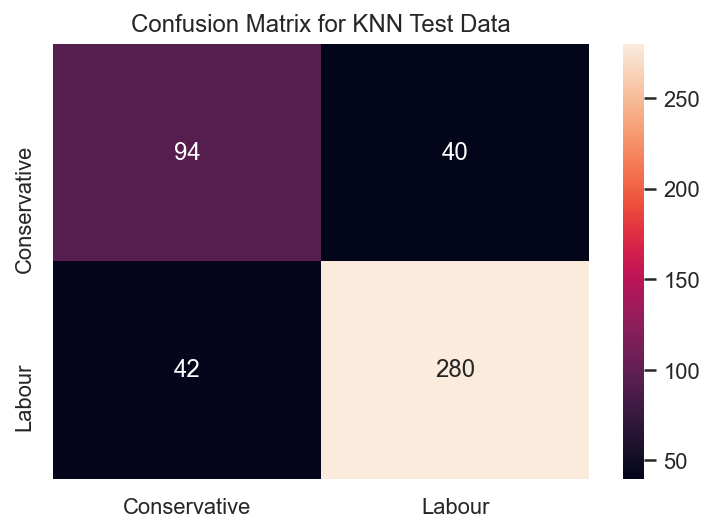

In [102]:
sns.heatmap(confusion_matrix(y_test, knn2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for KNN Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> KNN - Standard Scaling of Only 'age'

In [103]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [104]:
knn3 = KNeighborsClassifier()
knn3.fit(X_train, y_train)

KNeighborsClassifier()

In [105]:
knn3_train_score = knn3.score(X_train, y_train)
knn3_test_score = knn3.score(X_test, y_test)
knn3_test_f1 = metrics.f1_score(y_test, knn3.predict(X_test))
knn3_test_f0 = metrics.f1_score(y_test, knn3.predict(X_test), pos_label=0)

print('KNN Train Score =', round(knn3_train_score, 4))
print('KNN Test Score =', round(knn3_test_score, 4))
print('KNN f1 Test Score for "Labour" =', round(knn3_test_f1, 4))
print('KNN f1 Test Score for "Conservative" =', round(knn3_test_f0, 4))

KNN Train Score = 0.8803
KNN Test Score = 0.8048
KNN f1 Test Score for "Labour" = 0.8624
KNN f1 Test Score for "Conservative" = 0.6642


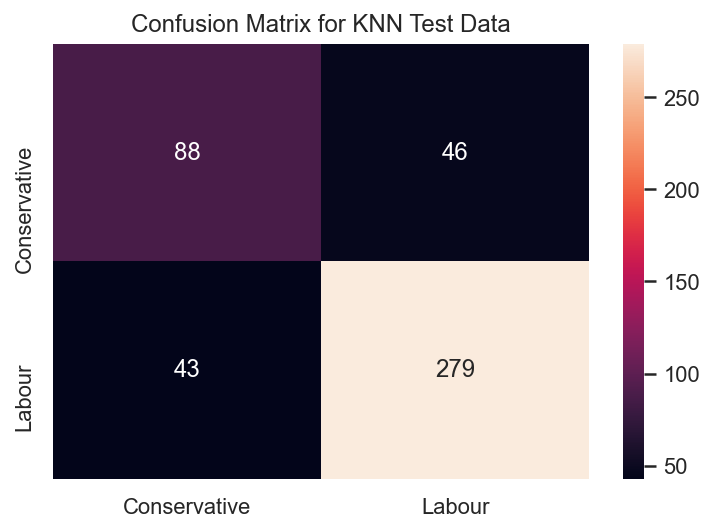

In [106]:
sns.heatmap(confusion_matrix(y_test, knn3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for KNN Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> KNN - Choosing Optimal Number of K value (Neighbours)

**Using MinMax Scaled Data of variable 'age' only**

In [107]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

# empty list that will hold accuracy scores
ac_scores = []

# perform accuracy metrics for values from 1,3,5....19
for k in range(1,20,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    # evaluate test accuracy
    scores = knn.score(X_test, y_test)
    ac_scores.append(scores)



KNeighborsClassifier(n_neighbors=1)

KNeighborsClassifier(n_neighbors=3)

KNeighborsClassifier()

KNeighborsClassifier(n_neighbors=7)

KNeighborsClassifier(n_neighbors=9)

KNeighborsClassifier(n_neighbors=11)

KNeighborsClassifier(n_neighbors=13)

KNeighborsClassifier(n_neighbors=15)

KNeighborsClassifier(n_neighbors=17)

KNeighborsClassifier(n_neighbors=19)

In [108]:
# changing to misclassification error
MCE = [1 - x for x in ac_scores]
MCE

[0.22807017543859653,
 0.1907894736842105,
 0.17982456140350878,
 0.17763157894736847,
 0.17982456140350878,
 0.17543859649122806,
 0.16885964912280704,
 0.16666666666666663,
 0.16666666666666663,
 0.17543859649122806]

**Plot misclassification error vs k (with k value on X-axis) using matplotli**

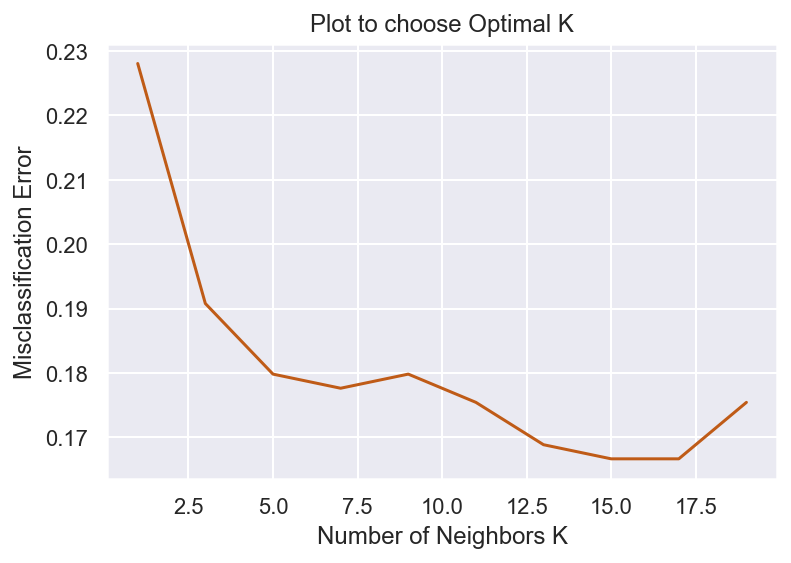

In [109]:
import matplotlib.pyplot as plt
# plot misclassification error vs k
plt.plot(range(1,20,2), MCE);
plt.xlabel('Number of Neighbors K');
plt.ylabel('Misclassification Error');

plt.title('Plot to choose Optimal K');
plt.savefig('elec_kplot.jpg', bbox_inches='tight');

For K = 15 & 17 it is giving the best test accuracy lets check train and test for K=15 with other evaluation metrics

In [110]:
from sklearn.neighbors import KNeighborsClassifier

KNN_model=KNeighborsClassifier(n_neighbors=15)
KNN_model.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=15)

In [111]:
## Performance Matrix on train data set
y_train_predict = KNN_model.predict(X_train)
model_score = KNN_model.score(X_train, y_train)
print(model_score)
print(metrics.confusion_matrix(y_train, y_train_predict))
print(metrics.classification_report(y_train, y_train_predict))

0.8407163053722903
[[230  96]
 [ 73 662]]
              precision    recall  f1-score   support

           0       0.76      0.71      0.73       326
           1       0.87      0.90      0.89       735

    accuracy                           0.84      1061
   macro avg       0.82      0.80      0.81      1061
weighted avg       0.84      0.84      0.84      1061



In [112]:
## Performance Matrix on test data set
y_test_predict = KNN_model.predict(X_test)
model_score = KNN_model.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_test_predict))
print(metrics.classification_report(y_test, y_test_predict))

0.8333333333333334
[[ 91  43]
 [ 33 289]]
              precision    recall  f1-score   support

           0       0.73      0.68      0.71       134
           1       0.87      0.90      0.88       322

    accuracy                           0.83       456
   macro avg       0.80      0.79      0.79       456
weighted avg       0.83      0.83      0.83       456



In [113]:
knn15_train_score = KNN_model.score(X_train, y_train)
knn15_test_score = KNN_model.score(X_test, y_test)
knn15_test_f1 = metrics.f1_score(y_test, KNN_model.predict(X_test))
knn15_test_f0 = metrics.f1_score(y_test, KNN_model.predict(X_test), pos_label=0)

print('KNN Train Score for K=15 is =', round(knn15_train_score, 4))
print('KNN Test Score for K=15 is =', round(knn15_test_score, 4))
print('KNN f1 Test Score for "Labour" for K=15 is  =', round(knn15_test_f1, 4))
print('KNN f1 Test Score for "Conservative" for K=15 is =', round(knn15_test_f0, 4))

KNN Train Score for K=15 is = 0.8407
KNN Test Score for K=15 is = 0.8333
KNN f1 Test Score for "Labour" for K=15 is  = 0.8838
KNN f1 Test Score for "Conservative" for K=15 is = 0.7054


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> KNN - Fine Tuning by Adjusting Threshold

**Using the above KNN model for Standard Scaled Data and K=15**

In [114]:
probs = KNN_model.predict_proba(X_train)
for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(probs[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
#     plt.figure(figsize=(6,4));
#     print('Confusion Matrix')
#     sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
    plt.show();

0.1 

Accuracy Score = 0.738
0.2 

Accuracy Score = 0.7983
0.3 

Accuracy Score = 0.8153
0.4 

Accuracy Score = 0.8341
0.5 

Accuracy Score = 0.8407
0.6 

Accuracy Score = 0.8332
0.7 

Accuracy Score = 0.8294
0.8 

Accuracy Score = 0.7549
0.9 

Accuracy Score = 0.6937


### Best Threshold for KNN = 0.5

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#D86969"> Boosting (Adaptive Boosting)

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> AdaBoost - MinMax Scaled of Only 'age'

In [115]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [116]:
abcl2 = AdaBoostClassifier()
abcl2.fit(X_train, y_train)

AdaBoostClassifier()

In [117]:
abcl2_train_score = abcl2.score(X_train, y_train)
abcl2_test_score = abcl2.score(X_test, y_test)
abcl2_test_f1 = metrics.f1_score(y_test, abcl2.predict(X_test))
abcl2_test_f0 = metrics.f1_score(y_test, abcl2.predict(X_test), pos_label=0)

print('AdaBoost Train Score =', round(abcl2_train_score, 4))
print('AdaBoost Test Score =', round(abcl2_test_score, 4))
print('AdaBoost f1 Test Score for "Labour" =', round(abcl2_test_f1, 4))
print('AdaBoost f1 Test Score for "Conservative" =', round(abcl2_test_f0, 4))

AdaBoost Train Score = 0.8567
AdaBoost Test Score = 0.818
AdaBoost f1 Test Score for "Labour" = 0.8721
AdaBoost f1 Test Score for "Conservative" = 0.6844


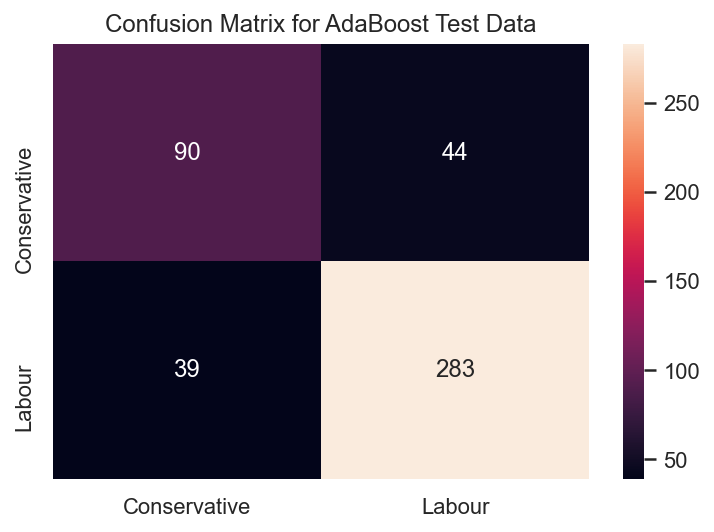

In [118]:
sns.heatmap(confusion_matrix(y_test, abcl2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for AdaBoost Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> AdaBoost - Standard Scaling of Only 'age'

In [119]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [120]:
abcl3 = AdaBoostClassifier()
abcl3.fit(X_train, y_train)

AdaBoostClassifier()

In [121]:
abcl3_train_score = abcl3.score(X_train, y_train)
abcl3_test_score = abcl3.score(X_test, y_test)
abcl3_test_f1 = metrics.f1_score(y_test, abcl3.predict(X_test))
abcl3_test_f0 = metrics.f1_score(y_test, abcl3.predict(X_test), pos_label=0)

print('AdaBoost Train Score =', round(abcl3_train_score, 4))
print('AdaBoost Test Score =', round(abcl3_test_score, 4))
print('AdaBoost f1 Test Score for "Labour" =', round(abcl3_test_f1, 4))
print('AdaBoost f1 Test Score for "Conservative" =', round(abcl3_test_f0, 4))

AdaBoost Train Score = 0.8567
AdaBoost Test Score = 0.818
AdaBoost f1 Test Score for "Labour" = 0.8721
AdaBoost f1 Test Score for "Conservative" = 0.6844


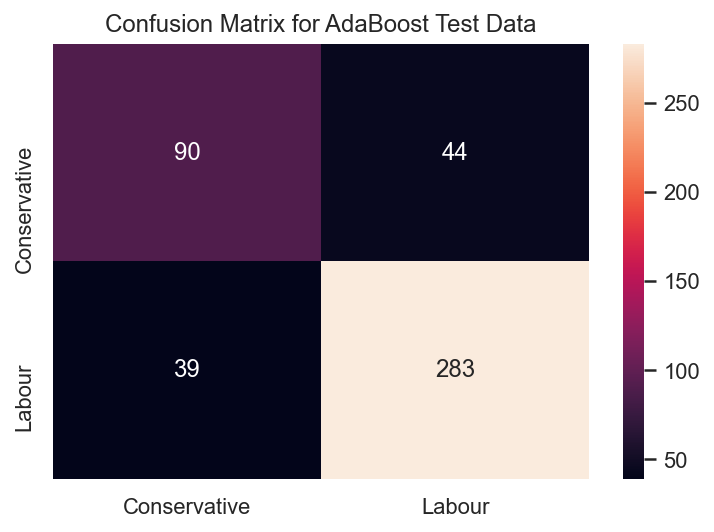

In [122]:
sns.heatmap(confusion_matrix(y_test, abcl3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for AdaBoost Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> AdaBoost - Fine Tuning by Adjusting Threshold

In [123]:
probs = abcl3.predict_proba(X_train)
for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(probs[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
#     plt.figure(figsize=(6,4));
#     print('Confusion Matrix')
#     sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
#     plt.show();

0.1 

Accuracy Score = 0.6927
0.2 

Accuracy Score = 0.6927
0.3 

Accuracy Score = 0.6927
0.4 

Accuracy Score = 0.6937
0.5 

Accuracy Score = 0.8567
0.6 

Accuracy Score = 0.4109
0.7 

Accuracy Score = 0.3073
0.8 

Accuracy Score = 0.3073
0.9 

Accuracy Score = 0.3073


### Best Threshold for AdaBoost = 0.5

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#00B1C6"> Boosting (Gradient Boosting)

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Gradient Boost - MinMax Scaled of Only 'age'

In [124]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [125]:
gbcl2 = GradientBoostingClassifier()
gbcl2.fit(X_train, y_train)

GradientBoostingClassifier()

In [126]:
gbcl2_train_score = gbcl2.score(X_train, y_train)
gbcl2_test_score = gbcl2.score(X_test, y_test)
gbcl2_test_f1 = metrics.f1_score(y_test, gbcl2.predict(X_test))
gbcl2_test_f0 = metrics.f1_score(y_test, gbcl2.predict(X_test), pos_label=0)

print('Gradient Boost Train Score =', round(gbcl2_train_score, 4))
print('Gradient Boost Test Score =', round(gbcl2_test_score, 4))
print('Gradient Boost f1 Test Score for "Labour" =', round(gbcl2_test_f1, 4))
print('Gradient Boost f1 Test Score for "Conservative" =', round(gbcl2_test_f0, 4))

Gradient Boost Train Score = 0.8907
Gradient Boost Test Score = 0.8377
Gradient Boost f1 Test Score for "Labour" = 0.8872
Gradient Boost f1 Test Score for "Conservative" = 0.7109


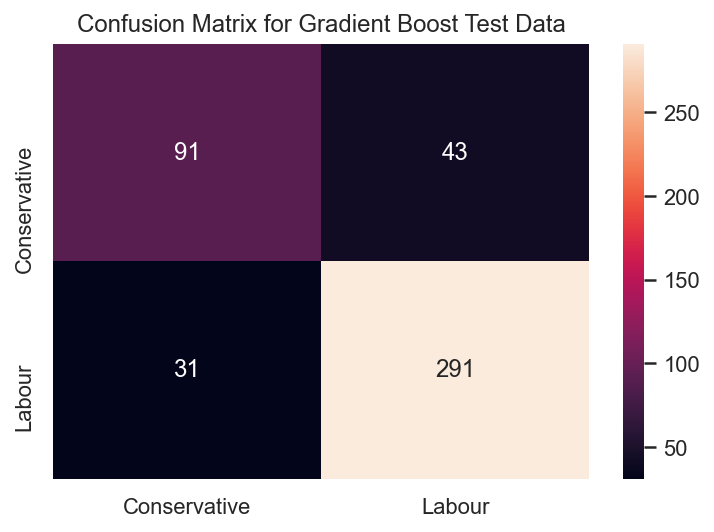

In [127]:
sns.heatmap(confusion_matrix(y_test, gbcl2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Gradient Boost Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Gradient Boost - Standard Scaling of Only 'age'

In [128]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [129]:
gbcl3 = GradientBoostingClassifier()
gbcl3.fit(X_train, y_train)

GradientBoostingClassifier()

In [130]:
gbcl3_train_score = gbcl3.score(X_train, y_train)
gbcl3_test_score = gbcl3.score(X_test, y_test)
gbcl3_test_f1 = metrics.f1_score(y_test, gbcl3.predict(X_test))
gbcl3_test_f0 = metrics.f1_score(y_test, gbcl3.predict(X_test), pos_label=0)

print('Gradient Boost Train Score =', round(gbcl3_train_score, 4))
print('Gradient Boost Test Score =', round(gbcl3_test_score, 4))
print('Gradient Boost f1 Test Score for "Labour" =', round(gbcl3_test_f1, 4))
print('Gradient Boost f1 Test Score for "Conservative" =', round(gbcl3_test_f0, 4))

Gradient Boost Train Score = 0.8907
Gradient Boost Test Score = 0.8377
Gradient Boost f1 Test Score for "Labour" = 0.8872
Gradient Boost f1 Test Score for "Conservative" = 0.7109


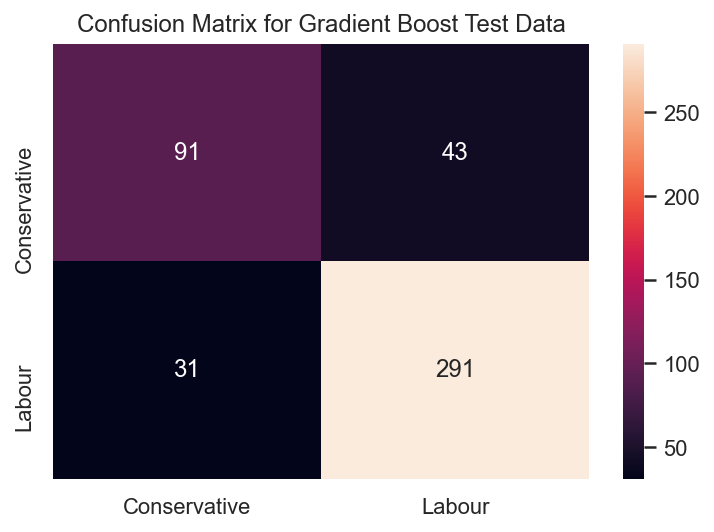

In [131]:
sns.heatmap(confusion_matrix(y_test, gbcl3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Gradient Boost Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Gradient Boost - Fine Tuning by Adjusting Threshold

In [132]:
probs = gbcl3.predict_proba(X_train)
for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(probs[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
#     plt.figure(figsize=(6,4));
#     print('Confusion Matrix')
#     sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
#     plt.show();

0.1 

Accuracy Score = 0.7408
0.2 

Accuracy Score = 0.8266
0.3 

Accuracy Score = 0.8624
0.4 

Accuracy Score = 0.8878
0.5 

Accuracy Score = 0.8907
0.6 

Accuracy Score = 0.8869
0.7 

Accuracy Score = 0.8709
0.8 

Accuracy Score = 0.8285
0.9 

Accuracy Score = 0.7597


### Best Threshold for Gradient Boost = 0.5

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#D86969"> Bagging (Random Forest)

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Random Forest - MinMax Scaled of Only 'age'

In [133]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_mm, y_mm, test_size=0.3, random_state=23)

In [134]:
rfcl2 = RandomForestClassifier()
rfcl2.fit(X_train, y_train)

RandomForestClassifier()

In [135]:
rfcl2_train_score = rfcl2.score(X_train, y_train)
rfcl2_test_score = rfcl2.score(X_test, y_test)
rfcl2_test_f1 = metrics.f1_score(y_test, rfcl2.predict(X_test))
rfcl2_test_f0 = metrics.f1_score(y_test, rfcl2.predict(X_test), pos_label=0)

print('Random Forest Train Score =', round(rfcl2_train_score, 4))
print('Random Forest Test Score =', round(rfcl2_test_score, 4))
print('Random Forest f1 Test Score for "Labour" =', round(rfcl2_test_f1, 4))
print('Random Forest f1 Test Score for "Conservative" =', round(rfcl2_test_f0, 4))

Random Forest Train Score = 0.9991
Random Forest Test Score = 0.8399
Random Forest f1 Test Score for "Labour" = 0.8879
Random Forest f1 Test Score for "Conservative" = 0.7203


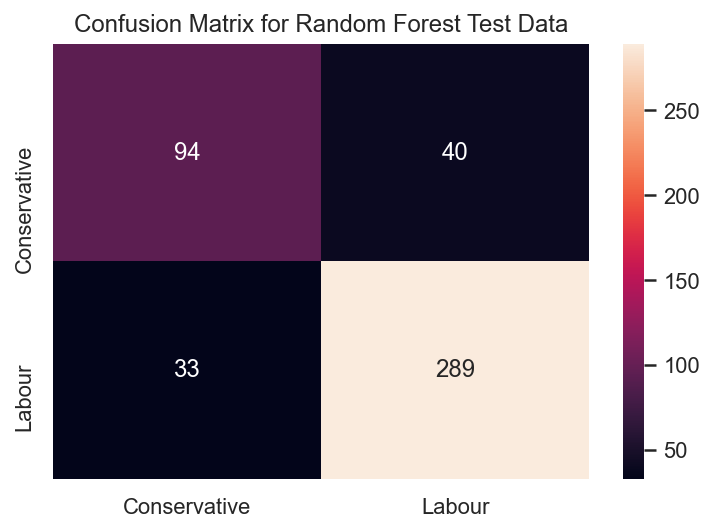

In [136]:
sns.heatmap(confusion_matrix(y_test, rfcl2.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Random Forest Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Random Forest - Standard Scaling of Only 'age'

In [137]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

In [138]:
rfcl3 = RandomForestClassifier()
rfcl3.fit(X_train, y_train)

RandomForestClassifier()

In [139]:
rfcl3_train_score = rfcl3.score(X_train, y_train)
rfcl3_test_score = rfcl3.score(X_test, y_test)
rfcl3_test_f1 = metrics.f1_score(y_test, rfcl3.predict(X_test))
rfcl3_test_f0 = metrics.f1_score(y_test, rfcl3.predict(X_test), pos_label=0)

print('Random Forest Train Score =', round(rfcl3_train_score, 4))
print('Random Forest Test Score =', round(rfcl3_test_score, 4))
print('Random Forest f1 Test Score for "Labour" =', round(rfcl3_test_f1, 4))
print('Random Forest f1 Test Score for "Conservative" =', round(rfcl3_test_f0, 4))

Random Forest Train Score = 0.9981
Random Forest Test Score = 0.8355
Random Forest f1 Test Score for "Labour" = 0.8841
Random Forest f1 Test Score for "Conservative" = 0.717


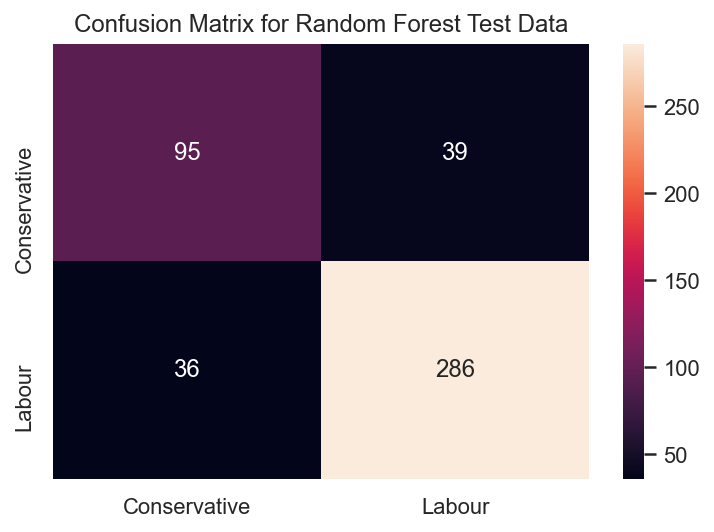

In [140]:
sns.heatmap(confusion_matrix(y_test, rfcl3.predict(X_test)), fmt='g', annot=True, xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
plt.title('Confusion Matrix for Random Forest Test Data');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Regularizing Random Forest - Hyper Parameter Tuning

In [141]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

# Defining parameters for GridSearch Cross validation

param = {'n_estimators': [51, 201, 301, 501],
        'criterion': ['gini', 'entropy'],
        'min_samples_leaf': [10, 20, 50, 100],
        'min_samples_split': [30 ,60, 150, 300],
        'max_features': [2, 3, 4]}


In [142]:
# # reg_rfcl = RandomForestClassifier(random_state=0)

# grid_search = GridSearchCV(estimator = reg_rfcl, param_grid = param, cv = 10, verbose=True)

In [143]:
# import time

# start = time.time()

# grid_search.fit(X_train, y_train)

# end = time.time()

# print('Total Time Taken = ', end-start)

In [144]:
# grid_search.best_params_

In [145]:
# # best_grid = grid_search.best_estimator_
rfcl_reg = RandomForestClassifier(criterion='gini',
 max_features='log2',
 min_samples_leaf= 20,
 min_samples_split= 30,
 n_estimators= 51)
rfcl_reg.fit(X_train, y_train)

ytrain_predict = rfcl_reg.predict(X_train)
ytest_predict = rfcl_reg.predict(X_test)

RandomForestClassifier(max_features='log2', min_samples_leaf=20,
                       min_samples_split=30, n_estimators=51)

In [146]:
# best_grid = grid_search.best_estimator_

In [147]:
# ytrain_predict = best_grid.predict(X_train)
# ytest_predict = best_grid.predict(X_test)

TRAIN Data
              precision    recall  f1-score   support

           0       0.79      0.69      0.74       326
           1       0.87      0.92      0.89       735

    accuracy                           0.85      1061
   macro avg       0.83      0.80      0.81      1061
weighted avg       0.85      0.85      0.85      1061



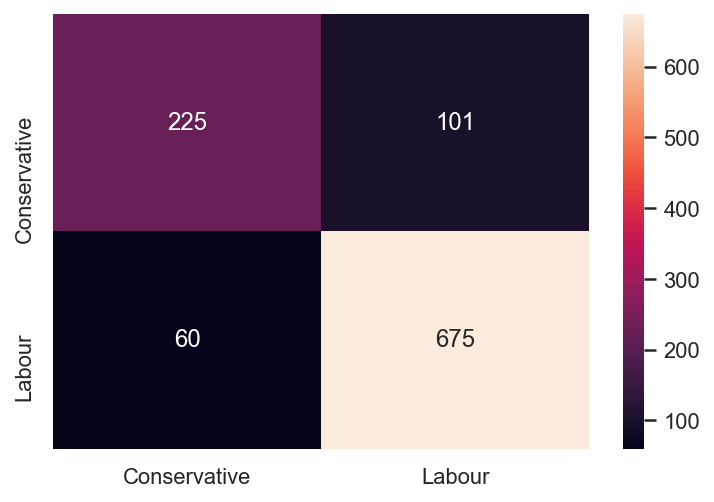

In [148]:
sns.heatmap(confusion_matrix(y_train,ytrain_predict), annot=True, fmt='g',xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
print('TRAIN Data');
print(classification_report(y_train,ytrain_predict));

TEST Data
              precision    recall  f1-score   support

           0       0.75      0.66      0.70       134
           1       0.86      0.91      0.89       322

    accuracy                           0.84       456
   macro avg       0.81      0.78      0.79       456
weighted avg       0.83      0.84      0.83       456



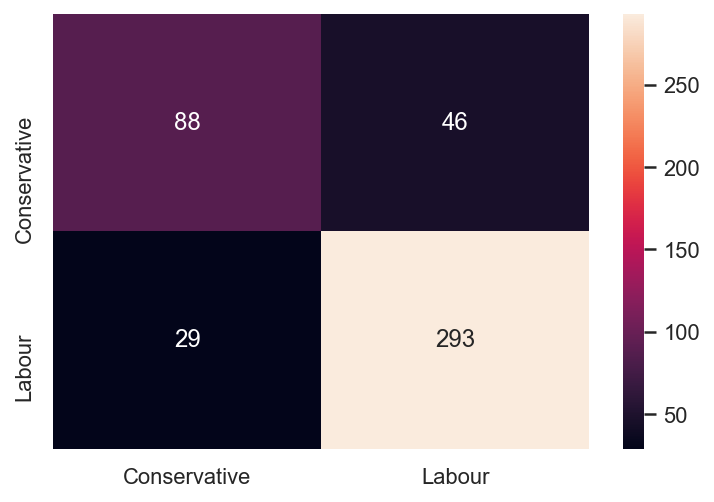

In [149]:
sns.heatmap(confusion_matrix(y_test,ytest_predict), annot=True, fmt='g',xticklabels=['Conservative', 'Labour'], yticklabels=['Conservative', 'Labour']);
print('TEST Data');
print(classification_report(y_test,ytest_predict));

In [151]:
feature_imp1 = pd.DataFrame((rfcl_reg.feature_importances_)*100, columns = ['Importance in %'], index=X_sc.columns)
feature_imp1.sort_values(by='Importance in %', ascending=False)

,Importance in %
Hague,32.302279
Blair,23.263631
Europe,20.551163
political.knowledge,8.897914
economic.cond.national,7.421857
age,5.456557
economic.cond.household,1.478790
gender,0.627809


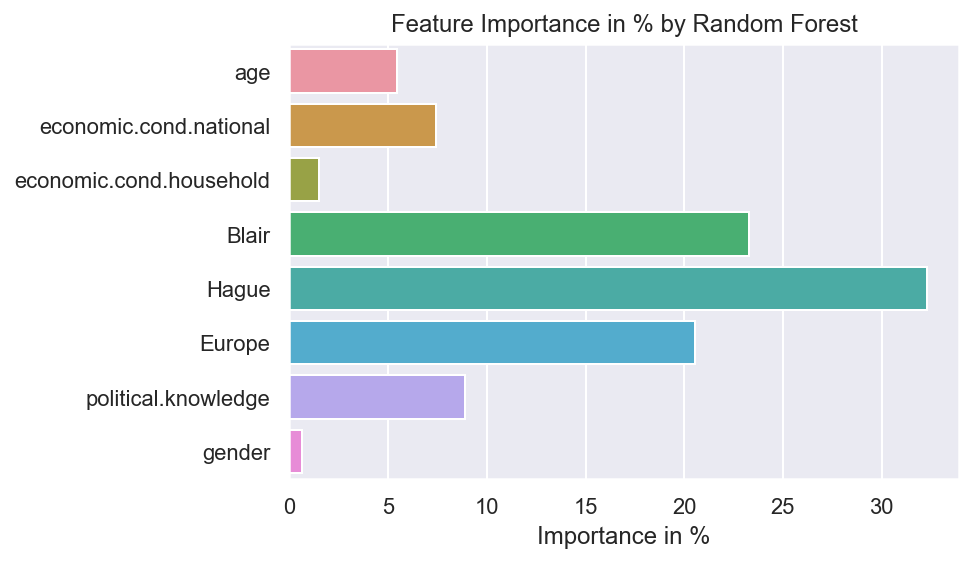

In [152]:
sns.barplot(x=feature_imp1['Importance in %'], y=X_sc.columns);
plt.title('Feature Importance in % by Random Forest');
plt.savefig('elec_feature_imp.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#D86969"> Random Forest - Fine Tuning by Adjusting Threshold

In [153]:
# ytrain_predict_prob = best_grid.predict_proba(X_train)
# ytest_predict_prob = best_grid.predict_proba(X_test)
# ytrain_predict_prob

ytrain_predict_prob = rfcl_reg.predict_proba(X_train)
ytest_predict_prob = rfcl_reg.predict_proba(X_test)

In [154]:
ytest_predict_prob

array([[6.95911121e-01, 3.04088879e-01],
       [1.98374887e-01, 8.01625113e-01],
       [4.40573488e-02, 9.55942651e-01],
       [2.36707981e-01, 7.63292019e-01],
       [4.88704468e-02, 9.51129553e-01],
       [5.11446045e-02, 9.48855395e-01],
       [1.24394597e-02, 9.87560540e-01],
       [5.96070683e-01, 4.03929317e-01],
       [3.97467897e-02, 9.60253210e-01],
       [5.51401919e-01, 4.48598081e-01],
       [3.04991086e-01, 6.95008914e-01],
       [6.95892785e-02, 9.30410722e-01],
       [9.80266072e-02, 9.01973393e-01],
       [3.58288426e-01, 6.41711574e-01],
       [1.14330669e-01, 8.85669331e-01],
       [5.77232741e-01, 4.22767259e-01],
       [3.88566964e-02, 9.61143304e-01],
       [4.74944431e-01, 5.25055569e-01],
       [1.28561235e-01, 8.71438765e-01],
       [1.39805380e-01, 8.60194620e-01],
       [2.96551181e-01, 7.03448819e-01],
       [8.24813742e-02, 9.17518626e-01],
       [3.72217877e-02, 9.62778212e-01],
       [2.47986327e-01, 7.52013673e-01],
       [4.195238

In [155]:


for j in np.arange(0.1,1,0.1):
    custom_prob = j #defining the cut-off value of our choice
    custom_cutoff_data=[]#defining an empty list
    for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(ytrain_predict_prob[:,1])[i] > custom_prob:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        custom_cutoff_data.append(a)#adding either 1 or 0 based on the condition to the end of the list defined by us
    print(round(j,3),'\n')
    print('Accuracy Score =',round(metrics.accuracy_score(y_train,custom_cutoff_data),4))
#     print('F1 Score',round(metrics.f1_score(y_train,custom_cutoff_data),4),'\n')
#     plt.figure(figsize=(6,4));
#     print('Confusion Matrix')
#     sns.heatmap(metrics.confusion_matrix(y_train,custom_cutoff_data),annot=True,fmt='.4g');
#     plt.show();

0.1 

Accuracy Score = 0.6927
0.2 

Accuracy Score = 0.7446
0.3 

Accuracy Score = 0.7945
0.4 

Accuracy Score = 0.8219
0.5 

Accuracy Score = 0.8483
0.6 

Accuracy Score = 0.8407
0.7 

Accuracy Score = 0.819
0.8 

Accuracy Score = 0.7295
0.9 

Accuracy Score = 0.6164


### Best Threshold for Random Forest = 0.6

In [156]:
ytrain_predict

array([1, 1, 1, ..., 1, 1, 0], dtype=int8)

In [157]:
train_cutoff_6 = []
test_cutoff_6 = []
for i in range(0,len(y_train)):#defining a loop for the length of the test data
        if np.array(ytrain_predict_prob[:,1])[i] > 0.6:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        train_cutoff_6.append(a)


for i in range(0,len(y_test)):#defining a loop for the length of the test data
        if np.array(ytest_predict_prob[:,1])[i] > 0.6:#issuing a condition for our probability values to be 
            #greater than the custom cutoff value
            a=1#if the probability values are greater than the custom cutoff then the value should be 1
        else:
            a=0#if the probability values are less than the custom cutoff then the value should be 0
        test_cutoff_6.append(a)

In [158]:
rfcl_train_score = metrics.accuracy_score(y_train, train_cutoff_6)
rfcl_test_score = metrics.accuracy_score(y_test, test_cutoff_6)
rfcl_test_f1 = metrics.f1_score(y_test, test_cutoff_6)
rfcl_test_f0 = metrics.f1_score(y_test, test_cutoff_6, pos_label=0)

print('Regularised Random Forest Train Score =', round(rfcl_train_score, 4))
print('Regularised Random Forest Test Score =', round(rfcl_test_score, 4))
print('Regularised Random Forest f1 Test Score for "Labour" =', round(rfcl_test_f1, 4))
print('Regularised Random Forest f1 Test Score for "Conservative" =', round(rfcl_test_f0, 4))

Regularised Random Forest Train Score = 0.8407
Regularised Random Forest Test Score = 0.8289
Regularised Random Forest f1 Test Score for "Labour" = 0.8762
Regularised Random Forest f1 Test Score for "Conservative" = 0.7234


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9C03FF"> Cross-Validation on Logistic Regression and LDA

* Logistic Regression and LDA are the best performing models considering Test Score
* Hence, lets cross validate and check consistency of scores over 10 folds

In [159]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(logit3, X_train, y_train, cv=10)
scores.mean()

0.8369158878504674

In [160]:
scores = cross_val_score(logit3, X_test, y_test, cv=10)
scores.mean()

0.8249275362318841

In [161]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(lda3, X_train, y_train, cv=10)
scores.mean()

0.8388026803032975

In [162]:
scores = cross_val_score(lda3, X_test, y_test, cv=10)
scores.mean()

0.8140579710144928

* **All above Cross validated scores are quite close to the scores received**
* **Hence we conclude that the Train Test Split done with random_state=23 is good**

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#FF6565"> ROC Curves of All Models

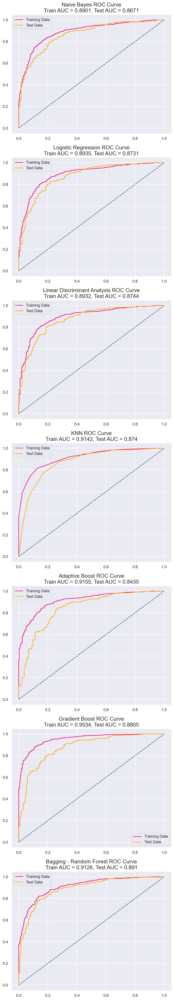

In [163]:
clf = [gnb4, best_model, lda3, KNN_model, abcl3, gbcl3, rfcl_reg]
mod_name = ['Naive Bayes','Logistic Regression', 'Linear Discriminant Analysis', 'KNN', 'Adaptive Boost', 'Gradient Boost', 'Bagging - Random Forest']
fig, axes = plt.subplots(7);
        
fig.set_size_inches(8, 50);
tr_auc=[]
te_auc=[]

for i in range(0, len(clf)):
    
        # predict probabilities
        probs = clf[i].predict_proba(X_train)
        # keep probabilities for the positive outcome only
        probs = probs[:, 1]
        # calculate AUC
        auc = metrics.roc_auc_score(y_train, probs)
        tr_auc.append(auc)
        
        # calculate roc curve
        train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
        axes[i].plot([0, 1], [0, 1], linestyle='--')
        # plot the roc curve for the model
        axes[i].plot(train_fpr, train_tpr,  label='Training Data');


        # predict probabilities
        probs = clf[i].predict_proba(X_test)
        # keep probabilities for the positive outcome only
        probs = probs[:, 1]
        # calculate AUC
        test_auc = roc_auc_score(y_test, probs)
        te_auc.append(test_auc)
        
        # calculate roc curve
        test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
        axes[i].plot([0, 1], [0, 1], linestyle='--')
        # plot the roc curve for the model
        axes[i].plot(test_fpr, test_tpr,  label='Test Data', color='orange');
        
        axes[i].set_title('{} ROC Curve\nTrain AUC = {}, Test AUC = {}'.format(mod_name[i], round(auc, 4), round(test_auc, 4)), fontsize=15);
        axes[i].legend()
#         print('{} AUC Train: %.3f'.format(mod_name[i]) % auc)
#         print('{} AUC Test: %.3f'.format(mod_name[i]) % auc)
        
        
plt.savefig('elec_allmod_roc.jpg', bbox_inches='tight');

In [164]:
tr_auc[0]
tr_auc[-1]

0.8900901464880431

0.9126100747047285

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#FF6565"> Generate Confusion Matrices for All Models

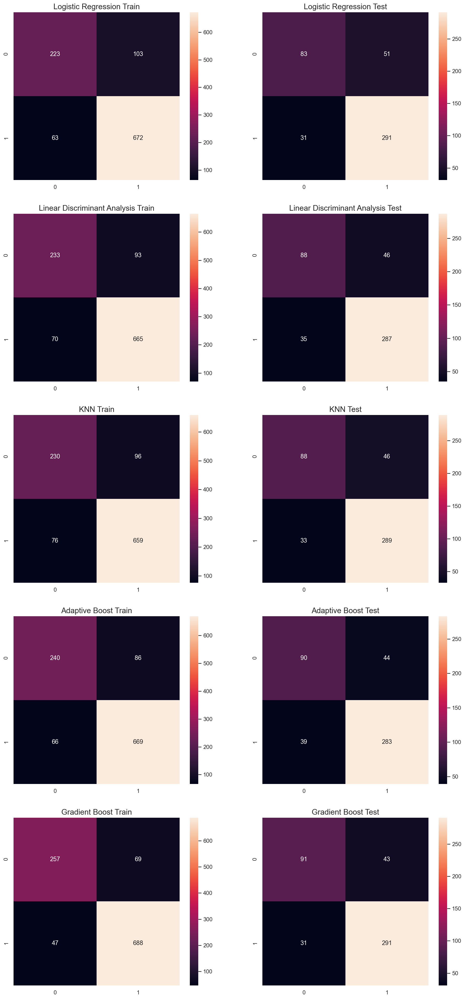

In [165]:
X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

clf = [best_model, lda3, KNN_model, abcl3, gbcl3]
mod_name = ['Logistic Regression', 'Linear Discriminant Analysis', 'KNN', 'Adaptive Boost', 'Gradient Boost']
fig, axes = plt.subplots(5, 2);
        
fig.set_size_inches(16, 35);

for i in range(0, len(clf)):
    ytrain_pr = clf[i].predict(X_train)
    ytest_pr = clf[i].predict(X_test)
    a = sns.heatmap(metrics.confusion_matrix(y_train,ytrain_pr),annot=True,fmt='.4g', ax=axes[i][0]);
    a.set_title('{} Train'.format(mod_name[i]), fontsize=15);
    
    a = sns.heatmap(metrics.confusion_matrix(y_test,ytest_pr),annot=True,fmt='.4g', ax=axes[i][1]);
    a.set_title('{} Test'.format(mod_name[i]), fontsize=15);

plt.savefig('elec_confusion.jpg', bbox_inches='tight');

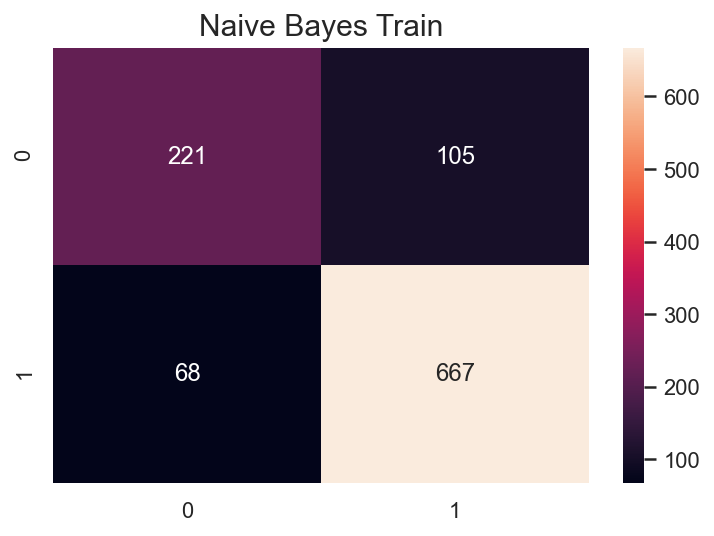

In [166]:
sns.heatmap(metrics.confusion_matrix(y_train,train_cutoff),annot=True,fmt='.4g');
plt.title('Naive Bayes Train', fontsize=15);
plt.savefig('elec_conf_naivetrain.jpg', bbox_inches='tight');

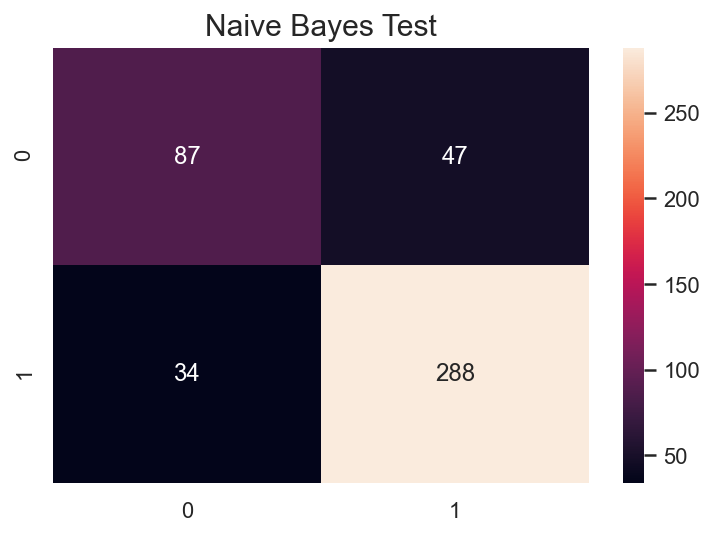

In [167]:
sns.heatmap(metrics.confusion_matrix(y_test,test_cutoff),annot=True,fmt='.4g');
plt.title('Naive Bayes Test', fontsize=15);
plt.savefig('elec_conf_naivetest.jpg', bbox_inches='tight');

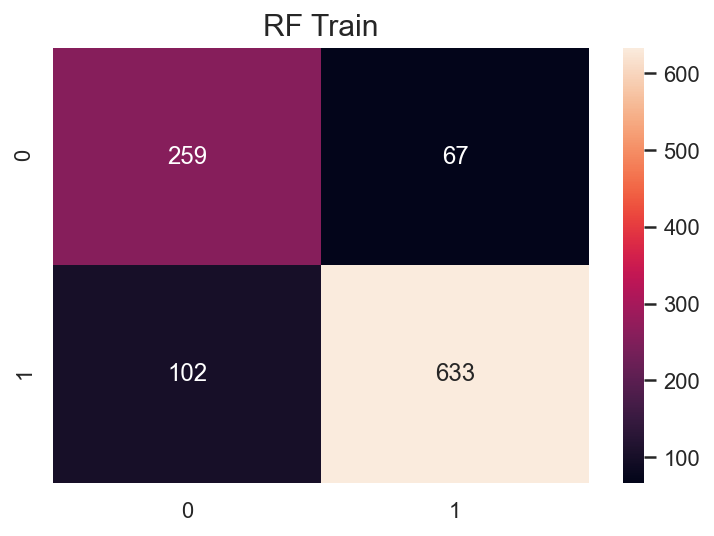

In [168]:
sns.heatmap(metrics.confusion_matrix(y_train,train_cutoff_6),annot=True,fmt='.4g');
plt.title('RF Train', fontsize=15);
plt.savefig('elec_conf_rftrain.jpg', bbox_inches='tight');

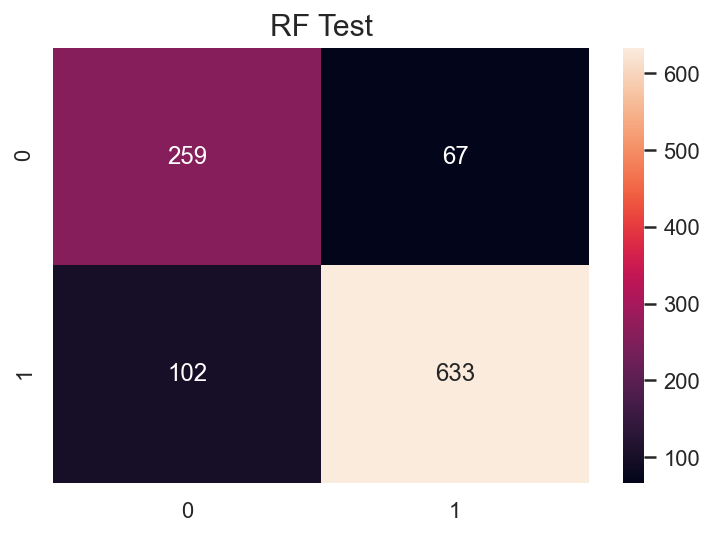

In [169]:
sns.heatmap(metrics.confusion_matrix(y_train,train_cutoff_6),annot=True,fmt='.4g');
plt.title('RF Test', fontsize=15);
plt.savefig('elec_conf_rftest.jpg', bbox_inches='tight');

In [ ]:
print(classification_report(y_test, ytest_predict))
cm_test_logit_tr = classification_report(y_test, ytest_predict, output_dict=True)
cm_test_logit_tr = pd.DataFrame(cm_test_logit_tr).T
cm_test_logit_tr.to_csv('cm_test_logit_tr.csv')

In [202]:
### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#FF6565"> Generate Confusion Matrices for All Models



X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

clf = [best_model, lda3, KNN_model, abcl3, gbcl3]
mod_name = ['Logistic Regression', 'Linear Discriminant Analysis', 'KNN', 'Adaptive Boost', 'Gradient Boost']

for i in range(0, len(clf)):
    ytrain_pr = clf[i].predict(X_train)
    ytest_pr = clf[i].predict(X_test)
    
    df_tra_cr = metrics.classification_report(y_train,ytrain_pr, output_dict=True)
    df_tra_cr = pd.DataFrame(df_tra_cr).T
    df_tra_cr.to_csv('{}_train_cr.csv'.format(i))
    
    print(mod_name[i])
    print(metrics.classification_report(y_train,ytrain_pr))
    print('')
    
    df_tes_cr = metrics.classification_report(y_test, ytest_pr, output_dict=True)
    df_tes_cr = pd.DataFrame(df_tes_cr).T
    df_tes_cr.to_csv('{}_test_cr.csv'.format(i))
    
    print(metrics.classification_report(y_test,ytest_pr))
    print('\n\n =============================================================')
    
print('Naive Bayes Train')
print(metrics.classification_report(y_train,train_cutoff))
df_tra_cr = metrics.classification_report(y_train,train_cutoff, output_dict=True)
df_tra_cr = pd.DataFrame(df_tra_cr).T
df_tra_cr.to_csv('naive_train_cr.csv')


print('Naive Bayes Test')
print(metrics.classification_report(y_test,test_cutoff))
df_tes_cr = metrics.classification_report(y_test,test_cutoff, output_dict=True)
df_tes_cr = pd.DataFrame(df_tes_cr).T
df_tes_cr.to_csv('naive_test_cr.csv')
print('\n\n ====================================================')


print('Random Forest Train')
print(metrics.classification_report(y_train,train_cutoff_6))
df_tra_cr = metrics.classification_report(y_train,train_cutoff_6, output_dict=True)
df_tra_cr = pd.DataFrame(df_tra_cr).T
df_tra_cr.to_csv('rf_train_cr.csv')


print('Random Forest Test')
print(metrics.classification_report(y_test,test_cutoff_6))
df_tes_cr = metrics.classification_report(y_test,test_cutoff_6, output_dict=True)
df_tes_cr = pd.DataFrame(df_tes_cr).T
df_tes_cr.to_csv('rf_test_cr.csv')
print('\n\n ====================================================')

Logistic Regression
              precision    recall  f1-score   support

           0       0.78      0.68      0.73       326
           1       0.87      0.91      0.89       735

    accuracy                           0.84      1061
   macro avg       0.82      0.80      0.81      1061
weighted avg       0.84      0.84      0.84      1061


              precision    recall  f1-score   support

           0       0.73      0.62      0.67       134
           1       0.85      0.90      0.88       322

    accuracy                           0.82       456
   macro avg       0.79      0.76      0.77       456
weighted avg       0.81      0.82      0.82       456



Linear Discriminant Analysis
              precision    recall  f1-score   support

           0       0.77      0.71      0.74       326
           1       0.88      0.90      0.89       735

    accuracy                           0.85      1061
   macro avg       0.82      0.81      0.82      1061
weighted avg       0.8

### <span style="font-family: Arial; font-weight:bold;font-size:1.8em;color:#FF6565"> All Model Comparision

In [179]:
# Using Standard Scaled Data of variable 'age'

X_train, X_test, y_train, y_test = train_test_split(X_sc, y_sc, test_size=0.3, random_state=23)

clf = [best_model, lda3, KNN_model, abcl3, gbcl3]

train_score =[]
test_score =[]
f1_score = []
f0_score = []
f1_train = []
f0_train = []
best_thresh = [0.5,0.5,0.5,0.5,0.5,0.4,0.6]
train_auc = []
test_auc = []
gnb4_train_f1 = metrics.f1_score(y_train, train_cutoff)
gnb4_train_f0 = metrics.f1_score(y_train, train_cutoff, pos_label=0)
rfcl_train_f1 = metrics.f1_score(y_train, train_cutoff_6)
rfcl_train_f0 = metrics.f1_score(y_train, train_cutoff_6, pos_label=0)

for i in range(0, len(clf)):
    train_score.append(clf[i].score(X_train, y_train))
    test_score.append(clf[i].score(X_test, y_test))
    f1_score.append(metrics.f1_score(y_test, clf[i].predict(X_test), pos_label=1))
    f0_score.append(metrics.f1_score(y_test, clf[i].predict(X_test), pos_label=0))
    f1_train.append(metrics.f1_score(y_train, clf[i].predict(X_train), pos_label=1))
    f0_train.append(metrics.f1_score(y_train, clf[i].predict(X_train), pos_label=0))
    train_auc.append(metrics.roc_auc_score(y_train, clf[i].predict_proba(X_train)[:,1]))
    test_auc.append(metrics.roc_auc_score(y_test, clf[i].predict_proba(X_test)[:,1]))
    
train_score.extend([gnb4_train_score, rfcl_train_score])
test_score.extend([gnb4_test_score, rfcl_test_score])

f1_score.extend([gnb4_test_f1, rfcl_test_f1])
f0_score.extend([gnb4_test_f0, rfcl_test_f0])

f1_train.extend([gnb4_train_f1, rfcl_train_f1])
f0_train.extend([gnb4_train_f0, rfcl_train_f0])

train_auc.extend([tr_auc[0], tr_auc[-1]])
test_auc.extend([tr_auc[0], tr_auc[-1]])

In [180]:
f1_train

[0.8900662251655629,
 0.8908238446081715,
 0.8845637583892617,
 0.8979865771812081,
 0.9222520107238605,
 0.8852023888520238,
 0.8822299651567944]

In [181]:
best_thresh

[0.5, 0.5, 0.5, 0.5, 0.5, 0.4, 0.6]

In [188]:
model_perf = pd.DataFrame({'Best Threshold': best_thresh ,'Train Score': train_score, 'Test Score': test_score, 'Train AUC': train_auc, 'Test AUC':test_auc ,'Test f1 Score Labour': f1_score, 'Test f1 Score Conservative': f0_score, 'Train f1 Score Labour': f1_train, 'Train f1 Score Conservative': f0_train},
                         index = ['Logistic Regression', 'Linear Discriminant Analysis', 'KNN for K=15', 'Adaptive Boosting', 'Gradient Boosting', 'Naive Bayes','Bagging (Random Forest Regularised)'])

In [189]:
# Sorted in Descending Order by TEST SCORES

model_perf.sort_values(by=['Test Score'], ascending=False)
model_perf.sort_values(by=['Test Score'], ascending=False).to_csv('elec_all_model_perf.csv')

,Best Threshold,Train Score,Test Score,Train AUC,Test AUC,Test f1 Score Labour,Test f1 Score Conservative,Train f1 Score Labour,Train f1 Score Conservative
Gradient Boosting,0.5,0.890669,0.837719,0.953366,0.880458,0.887195,0.710937,0.922252,0.815873
Bagging (Random Forest Regularised),0.6,0.840716,0.828947,0.912610,0.912610,0.876190,0.723404,0.882230,0.754003
KNN for K=15,0.5,0.837889,0.826754,0.914213,0.874038,0.879756,0.690196,0.884564,0.727848
Linear Discriminant Analysis,0.5,0.846371,0.822368,0.893216,0.874409,0.876336,0.684825,0.890824,0.740859
Naive Bayes,0.4,0.836946,0.822368,0.890090,0.890090,0.876712,0.682353,0.885202,0.718699
Logistic Regression,0.5,0.843544,0.820175,0.893537,0.873053,0.876506,0.669355,0.890066,0.728758
Adaptive Boosting,0.5,0.856739,0.817982,0.915471,0.843515,0.872111,0.684411,0.897987,0.759494


In [192]:
# Sorted in Descending Order by f1 SCORE FOR LABOUR

model_perf.sort_values(by=['Test f1 Score Labour'], ascending=False)
model_perf.sort_values(by=['Test f1 Score Labour'], ascending=False).to_csv('elec_all_model_perf_f1lab.csv')

,Best Threshold,Train Score,Test Score,Train AUC,Test AUC,Test f1 Score Labour,Test f1 Score Conservative,Train f1 Score Labour,Train f1 Score Conservative
Gradient Boosting,0.5,0.890669,0.837719,0.953366,0.880458,0.887195,0.710937,0.922252,0.815873
KNN for K=15,0.5,0.837889,0.826754,0.914213,0.874038,0.879756,0.690196,0.884564,0.727848
Naive Bayes,0.4,0.836946,0.822368,0.890090,0.890090,0.876712,0.682353,0.885202,0.718699
Logistic Regression,0.5,0.843544,0.820175,0.893537,0.873053,0.876506,0.669355,0.890066,0.728758
Linear Discriminant Analysis,0.5,0.846371,0.822368,0.893216,0.874409,0.876336,0.684825,0.890824,0.740859
Bagging (Random Forest Regularised),0.6,0.840716,0.828947,0.912610,0.912610,0.876190,0.723404,0.882230,0.754003
Adaptive Boosting,0.5,0.856739,0.817982,0.915471,0.843515,0.872111,0.684411,0.897987,0.759494


In [193]:
# Sorted in Descending Order by f1 SCORE FOR CONSERVATIVE

model_perf.sort_values(by=['Test f1 Score Conservative'], ascending=False)
model_perf.sort_values(by=['Test f1 Score Conservative'], ascending=False).to_csv('elec_all_model_perf_f1cons.csv')

,Best Threshold,Train Score,Test Score,Train AUC,Test AUC,Test f1 Score Labour,Test f1 Score Conservative,Train f1 Score Labour,Train f1 Score Conservative
Bagging (Random Forest Regularised),0.6,0.840716,0.828947,0.912610,0.912610,0.876190,0.723404,0.882230,0.754003
Gradient Boosting,0.5,0.890669,0.837719,0.953366,0.880458,0.887195,0.710937,0.922252,0.815873
KNN for K=15,0.5,0.837889,0.826754,0.914213,0.874038,0.879756,0.690196,0.884564,0.727848
Linear Discriminant Analysis,0.5,0.846371,0.822368,0.893216,0.874409,0.876336,0.684825,0.890824,0.740859
Adaptive Boosting,0.5,0.856739,0.817982,0.915471,0.843515,0.872111,0.684411,0.897987,0.759494
Naive Bayes,0.4,0.836946,0.822368,0.890090,0.890090,0.876712,0.682353,0.885202,0.718699
Logistic Regression,0.5,0.843544,0.820175,0.893537,0.873053,0.876506,0.669355,0.890066,0.728758


In [194]:
# Sorted in Descending Order by TEST AUC

model_perf.sort_values(by=['Test AUC'], ascending=False)
model_perf.sort_values(by=['Test AUC'], ascending=False).to_csv('elec_all_model_perf_testauc.csv')

,Best Threshold,Train Score,Test Score,Train AUC,Test AUC,Test f1 Score Labour,Test f1 Score Conservative,Train f1 Score Labour,Train f1 Score Conservative
Bagging (Random Forest Regularised),0.6,0.840716,0.828947,0.912610,0.912610,0.876190,0.723404,0.882230,0.754003
Naive Bayes,0.4,0.836946,0.822368,0.890090,0.890090,0.876712,0.682353,0.885202,0.718699
Gradient Boosting,0.5,0.890669,0.837719,0.953366,0.880458,0.887195,0.710937,0.922252,0.815873
Linear Discriminant Analysis,0.5,0.846371,0.822368,0.893216,0.874409,0.876336,0.684825,0.890824,0.740859
KNN for K=15,0.5,0.837889,0.826754,0.914213,0.874038,0.879756,0.690196,0.884564,0.727848
Logistic Regression,0.5,0.843544,0.820175,0.893537,0.873053,0.876506,0.669355,0.890066,0.728758
Adaptive Boosting,0.5,0.856739,0.817982,0.915471,0.843515,0.872111,0.684411,0.897987,0.759494


In [195]:
# Sorted in Descending Order by TEST SCORE AND THEN TEST AUC

model_perf.sort_values(by=['Test Score', 'Test AUC'], ascending=False)
model_perf.sort_values(by=['Test Score', 'Test AUC'], ascending=False).to_csv('elec_all_model_perf_testscoreauc.csv')

,Best Threshold,Train Score,Test Score,Train AUC,Test AUC,Test f1 Score Labour,Test f1 Score Conservative,Train f1 Score Labour,Train f1 Score Conservative
Gradient Boosting,0.5,0.890669,0.837719,0.953366,0.880458,0.887195,0.710937,0.922252,0.815873
Bagging (Random Forest Regularised),0.6,0.840716,0.828947,0.912610,0.912610,0.876190,0.723404,0.882230,0.754003
KNN for K=15,0.5,0.837889,0.826754,0.914213,0.874038,0.879756,0.690196,0.884564,0.727848
Naive Bayes,0.4,0.836946,0.822368,0.890090,0.890090,0.876712,0.682353,0.885202,0.718699
Linear Discriminant Analysis,0.5,0.846371,0.822368,0.893216,0.874409,0.876336,0.684825,0.890824,0.740859
Logistic Regression,0.5,0.843544,0.820175,0.893537,0.873053,0.876506,0.669355,0.890066,0.728758
Adaptive Boosting,0.5,0.856739,0.817982,0.915471,0.843515,0.872111,0.684411,0.897987,0.759494


.

==================================================================================================================

==================================================================================================================

# Problem 2 - US Presidents' Speech Text Analytics

#### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#424949"> In this particular project, we are going to work on the inaugural corpora from the nltk in Python. We will be looking at the following speeches of the Presidents of the United States of America:

#### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#424949"> President Franklin D. Roosevelt in 1941
#### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#424949"> President John F. Kennedy in 1961
#### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#424949"> President Richard Nixon in 1973

## Import and read data

In [147]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import inaugural
from itertools import chain
import itertools
import nltk.data
import nltk.tokenize

from nltk.stem.snowball import SnowballStemmer
import json
import re
import string

from sklearn.feature_extraction.text import TfidfVectorizer

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('inaugural')


import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('deep')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/chetan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package punkt to /Users/chetan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

[nltk_data] Downloading package inaugural to
[nltk_data]     /Users/chetan/nltk_data...
[nltk_data]   Package inaugural is already up-to-date!


True

In [148]:
## Let us check the version of the various libraries
print('Numpy version:',np.__version__)
print('Pandas version:',pd.__version__)
print('Regular Expression version:',re.__version__)
print('Natural Language Tool Kit version:',nltk.__version__)
print('Matplotlib version:',matplotlib.__version__)

Numpy version: 1.19.2
Pandas version: 1.1.3
Regular Expression version: 2.2.1
Natural Language Tool Kit version: 3.5
Matplotlib version: 3.3.2


In [184]:

roosevelt = inaugural.raw('1941-Roosevelt.txt')
kennedy = inaugural.raw('1961-Kennedy.txt')
nixon = inaugural.raw('1973-Nixon.txt')

In [185]:
roosevelt

'On each national day of inauguration since 1789, the people have renewed their sense of dedication to the United States.\n\nIn Washington\'s day the task of the people was to create and weld together a nation.\n\nIn Lincoln\'s day the task of the people was to preserve that Nation from disruption from within.\n\nIn this day the task of the people is to save that Nation and its institutions from disruption from without.\n\nTo us there has come a time, in the midst of swift happenings, to pause for a moment and take stock -- to recall what our place in history has been, and to rediscover what we are and what we may be. If we do not, we risk the real peril of inaction.\n\nLives of nations are determined not by the count of years, but by the lifetime of the human spirit. The life of a man is three-score years and ten: a little more, a little less. The life of a nation is the fullness of the measure of its will to live.\n\nThere are men who doubt this. There are men who believe that democr

In [186]:
kennedy

'Vice President Johnson, Mr. Speaker, Mr. Chief Justice, President Eisenhower, Vice President Nixon, President Truman, reverend clergy, fellow citizens, we observe today not a victory of party, but a celebration of freedom -- symbolizing an end, as well as a beginning -- signifying renewal, as well as change. For I have sworn I before you and Almighty God the same solemn oath our forebears l prescribed nearly a century and three quarters ago.\n\nThe world is very different now. For man holds in his mortal hands the power to abolish all forms of human poverty and all forms of human life. And yet the same revolutionary beliefs for which our forebears fought are still at issue around the globe -- the belief that the rights of man come not from the generosity of the state, but from the hand of God.\n\nWe dare not forget today that we are the heirs of that first revolution. Let the word go forth from this time and place, to friend and foe alike, that the torch has been passed to a new gener

In [187]:
nixon

'Mr. Vice President, Mr. Speaker, Mr. Chief Justice, Senator Cook, Mrs. Eisenhower, and my fellow citizens of this great and good country we share together:\n\nWhen we met here four years ago, America was bleak in spirit, depressed by the prospect of seemingly endless war abroad and of destructive conflict at home.\n\nAs we meet here today, we stand on the threshold of a new era of peace in the world.\n\nThe central question before us is: How shall we use that peace? Let us resolve that this era we are about to enter will not be what other postwar periods have so often been: a time of retreat and isolation that leads to stagnation at home and invites new danger abroad.\n\nLet us resolve that this will be what it can become: a time of great responsibilities greatly borne, in which we renew the spirit and the promise of America as we enter our third century as a nation.\n\nThis past year saw far-reaching results from our new policies for peace. By continuing to revitalize our traditional

In [150]:
inaugural.fileids()

['1789-Washington.txt',
 '1793-Washington.txt',
 '1797-Adams.txt',
 '1801-Jefferson.txt',
 '1805-Jefferson.txt',
 '1809-Madison.txt',
 '1813-Madison.txt',
 '1817-Monroe.txt',
 '1821-Monroe.txt',
 '1825-Adams.txt',
 '1829-Jackson.txt',
 '1833-Jackson.txt',
 '1837-VanBuren.txt',
 '1841-Harrison.txt',
 '1845-Polk.txt',
 '1849-Taylor.txt',
 '1853-Pierce.txt',
 '1857-Buchanan.txt',
 '1861-Lincoln.txt',
 '1865-Lincoln.txt',
 '1869-Grant.txt',
 '1873-Grant.txt',
 '1877-Hayes.txt',
 '1881-Garfield.txt',
 '1885-Cleveland.txt',
 '1889-Harrison.txt',
 '1893-Cleveland.txt',
 '1897-McKinley.txt',
 '1901-McKinley.txt',
 '1905-Roosevelt.txt',
 '1909-Taft.txt',
 '1913-Wilson.txt',
 '1917-Wilson.txt',
 '1921-Harding.txt',
 '1925-Coolidge.txt',
 '1929-Hoover.txt',
 '1933-Roosevelt.txt',
 '1937-Roosevelt.txt',
 '1941-Roosevelt.txt',
 '1945-Roosevelt.txt',
 '1949-Truman.txt',
 '1953-Eisenhower.txt',
 '1957-Eisenhower.txt',
 '1961-Kennedy.txt',
 '1965-Johnson.txt',
 '1969-Nixon.txt',
 '1973-Nixon.txt',
 '1

In [151]:
print('Num of files in INAUGURAL CORPUS =',len(inaugural.fileids()))

Num of files in INAUGURAL CORPUS = 58


In [152]:
# Finding index of each of the requires file in the Corpus inaugural

rindex = inaugural.fileids().index('1941-Roosevelt.txt')
kindex = inaugural.fileids().index('1961-Kennedy.txt')
nindex = inaugural.fileids().index('1973-Nixon.txt')

## Number of Words, characters, sentences

In [153]:
# Creating a list of Bag of Words of each Speech

rwords = inaugural.words('1941-Roosevelt.txt')
kwords = inaugural.words('1961-Kennedy.txt')
nwords = inaugural.words('1973-Nixon.txt')

In [154]:
rwords
kwords
nwords

['On', 'each', 'national', 'day', 'of', 'inauguration', ...]

['Vice', 'President', 'Johnson', ',', 'Mr', '.', ...]

['Mr', '.', 'Vice', 'President', ',', 'Mr', '.', ...]

In [155]:
nwords[-2]

'purpose'

In [156]:
# Creating a Bag of Words of All 3 Speeches

allwords = rwords + kwords + nwords

allwords
allwords[-2]
nltk.FreqDist(allwords).most_common(10)

['On', 'each', 'national', 'day', 'of', 'inauguration', ...]

'purpose'

[('the', 267),
 (',', 258),
 ('of', 214),
 ('.', 186),
 ('to', 138),
 ('and', 128),
 ('in', 108),
 ('a', 92),
 ('we', 87),
 ('that', 74)]

### Roosevelt Speech

In [157]:
raw=inaugural.raw('1941-Roosevelt.txt')
tokenized_sentences=nltk.sent_tokenize(raw)
for each_sentence in tokenized_sentences:
   words=nltk.tokenize.word_tokenize(each_sentence)
#    print(each_sentence)   #prints tokenized sentences from samp.txt
tokenized_words=nltk.word_tokenize(raw)
for each_word in tokenized_words:
   words=nltk.tokenize.word_tokenize(each_word)
#    print(each_word)      #prints tokenized words from samp.txt

tokenized_chars = [w for w in itertools.chain(*[sent for sent in tokenized_sentences])]

In [158]:
print('Num of sentences in Raw Roosevelt Speech =',len(tokenized_sentences))
print('Num of words in Raw Roosevelt Speech =',len(tokenized_words))
print('Num of characters in Raw Roosevelt Speech =',len(tokenized_chars))

Num of sentences in Raw Roosevelt Speech = 68
Num of words in Raw Roosevelt Speech = 1526
Num of characters in Raw Roosevelt Speech = 7466


### Kennedy Speech

In [159]:
raw=inaugural.raw('1961-Kennedy.txt')
tokenized_sentences=nltk.sent_tokenize(raw)
for each_sentence in tokenized_sentences:
   words=nltk.tokenize.word_tokenize(each_sentence)
#    print(each_sentence)   #prints tokenized sentences from samp.txt
tokenized_words=nltk.word_tokenize(raw)
for each_word in tokenized_words:
   words=nltk.tokenize.word_tokenize(each_word)
#    print(each_word)      #prints tokenized words from samp.txt

tokenized_chars = [w for w in itertools.chain(*[sent for sent in tokenized_sentences])]

In [160]:
print('Num of sentences in Raw Kennedy Speech =',len(tokenized_sentences))
print('Num of words in Raw Kennedy Speech =',len(tokenized_words))
print('Num of characters in Raw Kennedy Speech =',len(tokenized_chars))

Num of sentences in Raw Kennedy Speech = 52
Num of words in Raw Kennedy Speech = 1543
Num of characters in Raw Kennedy Speech = 7540


### Nixon Speech

In [161]:
raw=inaugural.raw('1973-Nixon.txt')
tokenized_sentences=nltk.sent_tokenize(raw)
for each_sentence in tokenized_sentences:
   words=nltk.tokenize.word_tokenize(each_sentence)
#    print(each_sentence)   #prints tokenized sentences from samp.txt
tokenized_words=nltk.word_tokenize(raw)
for each_word in tokenized_words:
   words=nltk.tokenize.word_tokenize(each_word)
#    print(each_word)      #prints tokenized words from samp.txt

tokenized_chars = [w for w in itertools.chain(*[sent for sent in tokenized_sentences])]

In [162]:
print('Num of sentences in Raw Nixon Speech =',len(tokenized_sentences))
print('Num of words in Raw Nixon Speech =',len(tokenized_words))
print('Num of characters in Raw Nixon Speech =',len(tokenized_chars))

Num of sentences in Raw Nixon Speech = 68
Num of words in Raw Nixon Speech = 2006
Num of characters in Raw Nixon Speech = 9874


### Remove Stopwords and Convert to Lowercase

In [188]:
stopwords = nltk.corpus.stopwords.words('english') +list(string.punctuation)
stopwords[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [191]:
# ROOSEVELT SPEECH

rwords = [w.lower() for w in rwords]
rwords_clean = [word for word in rwords if word not in stopwords]


rwords_freq = nltk.FreqDist(rwords_clean)

In [192]:
rwords_freq

FreqDist({'--': 25, 'nation': 12, 'know': 10, 'spirit': 9, 'life': 9, 'democracy': 9, 'us': 8, 'people': 7, 'america': 7, 'years': 6, ...})

In [194]:
# KENNEDY SPEECH

kwords = [w.lower() for w in kwords]
kwords_clean = [word for word in kwords if word not in stopwords]


kwords_freq = nltk.FreqDist(kwords_clean)

In [195]:
kwords_freq

FreqDist({'--': 25, 'let': 16, 'us': 12, 'world': 8, 'sides': 8, 'new': 7, 'pledge': 7, 'citizens': 5, 'power': 5, 'shall': 5, ...})

In [196]:
# NIXON SPEECH

nwords = [w.lower() for w in nwords]
nwords_clean = [word for word in nwords if word not in stopwords]


nwords_freq = nltk.FreqDist(nwords_clean)

In [200]:
nwords_freq

FreqDist({'us': 26, 'let': 22, 'america': 21, 'peace': 19, 'world': 18, '--': 17, 'new': 15, 'nation': 11, 'responsibility': 11, 'government': 10, ...})

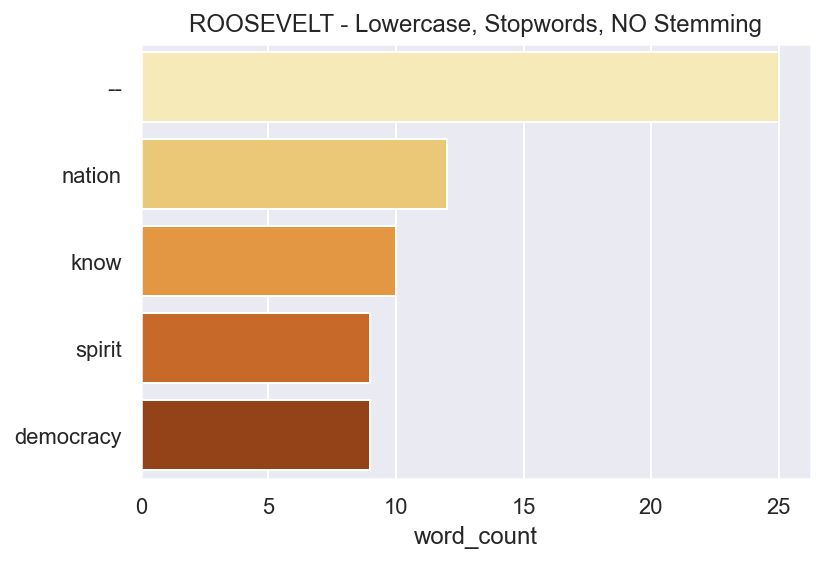

In [277]:
rwords_ns = pd.Series(rwords_clean)
rwords_ns = pd.DataFrame(rwords_ns.value_counts(), columns=['word_count'])

all_words_ns = rwords_ns.head(5)
sns.barplot(x=all_words_ns['word_count'], y=all_words_ns.index, palette='YlOrBr');
plt.title('ROOSEVELT - Lowercase, Stopwords, NO Stemming')
plt.savefig('ROOS_words.jpg', bbox_inches='tight');

In [198]:
allwords = [w.lower() for w in allwords]
allwords_clean = [word for word in allwords if word not in stopwords]


allwords_freq = nltk.FreqDist(allwords_clean)

word_features = [item[0] for item in allwords_freq.most_common(2000)]


In [199]:
allwords_freq

FreqDist({'--': 67, 'us': 46, 'let': 39, 'america': 30, 'world': 29, 'new': 27, 'nation': 25, 'peace': 23, 'people': 14, 'government': 14, ...})

In [205]:
# Adding more non-value words to STOPWORDS

stopwords.extend(['--', 'us', 'let', 'america', 'shall', 'know'])

In [206]:
allwords = [w.lower() for w in allwords]
allwords_clean = [word for word in allwords if word not in stopwords]


allwords_freq = nltk.FreqDist(allwords_clean)

word_features = [item[0] for item in allwords_freq.most_common(2000)]

In [208]:
allwords_freq

FreqDist({'world': 29, 'new': 27, 'nation': 25, 'peace': 23, 'people': 14, 'government': 14, 'freedom': 14, 'years': 13, 'life': 13, 'history': 12, ...})

In [209]:
allwords_clean[:20]

['national',
 'day',
 'inauguration',
 'since',
 '1789',
 'people',
 'renewed',
 'sense',
 'dedication',
 'united',
 'states',
 'washington',
 'day',
 'task',
 'people',
 'create',
 'weld',
 'together',
 'nation',
 'lincoln']

In [210]:
allwords_freq

FreqDist({'world': 29, 'new': 27, 'nation': 25, 'peace': 23, 'people': 14, 'government': 14, 'freedom': 14, 'years': 13, 'life': 13, 'history': 12, ...})

In [249]:
allwords_ns = pd.Series(allwords_clean)

In [250]:
allwords_ns = pd.DataFrame(allwords_ns.value_counts(), columns=['word_count'])

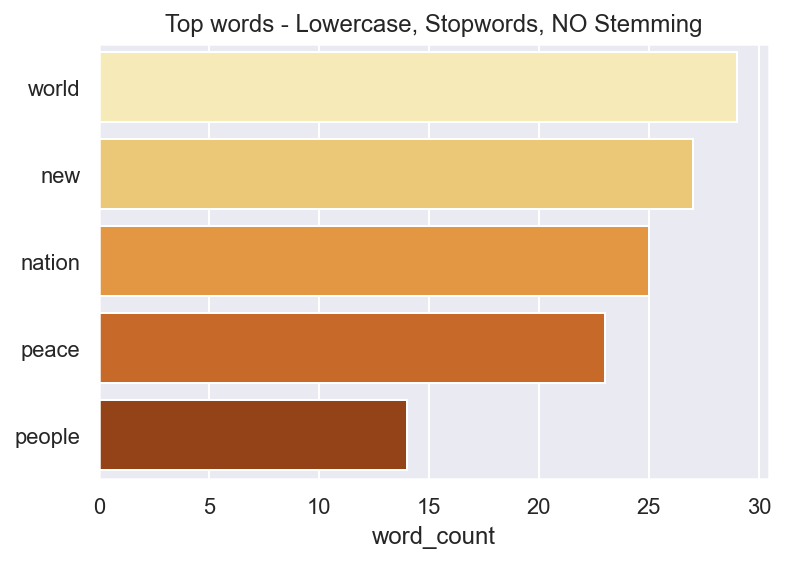

In [254]:

all_words_ns = allwords_ns.head(5)
sns.barplot(x=all_words_ns['word_count'], y=all_words_ns.index, palette='YlOrBr');
plt.title('Top words - Lowercase, Stopwords, NO Stemming')
plt.savefig('all_words.jpg', bbox_inches='tight');

### Stemming

In [212]:
stemmer = SnowballStemmer("english")

In [215]:
# senti.text=senti['text'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))

# allwords_clean_series = pd.Series(allwords_clean)
# allwords_clean_series = allwords_clean_series.apply(lambda x: " ".join(stemmer.stem(word) for word in x.split()))

allwords_clean_stemmed = []
for w in allwords_clean:
    print(w, ' : ', stemmer.stem(w))
    allwords_clean_stemmed.append(stemmer.stem(w))

national  :  nation
day  :  day
inauguration  :  inaugur
since  :  sinc
1789  :  1789
people  :  peopl
renewed  :  renew
sense  :  sens
dedication  :  dedic
united  :  unit
states  :  state
washington  :  washington
day  :  day
task  :  task
people  :  peopl
create  :  creat
weld  :  weld
together  :  togeth
nation  :  nation
lincoln  :  lincoln
day  :  day
task  :  task
people  :  peopl
preserve  :  preserv
nation  :  nation
disruption  :  disrupt
within  :  within
day  :  day
task  :  task
people  :  peopl
save  :  save
nation  :  nation
institutions  :  institut
disruption  :  disrupt
without  :  without
come  :  come
time  :  time
midst  :  midst
swift  :  swift
happenings  :  happen
pause  :  paus
moment  :  moment
take  :  take
stock  :  stock
recall  :  recal
place  :  place
history  :  histori
rediscover  :  rediscov
may  :  may
risk  :  risk
real  :  real
peril  :  peril
inaction  :  inact
lives  :  live
nations  :  nation
determined  :  determin
count  :  count
years  :  year

nation  :  nation
speaks  :  speak
processes  :  process
governing  :  govern
sovereignties  :  sovereignti
48  :  48
states  :  state
speaks  :  speak
counties  :  counti
cities  :  citi
towns  :  town
villages  :  villag
speaks  :  speak
nations  :  nation
hemisphere  :  hemispher
across  :  across
seas  :  sea
enslaved  :  enslav
well  :  well
free  :  free
sometimes  :  sometim
fail  :  fail
hear  :  hear
heed  :  heed
voices  :  voic
freedom  :  freedom
privilege  :  privileg
freedom  :  freedom
old  :  old
old  :  old
story  :  stori
destiny  :  destini
proclaimed  :  proclaim
words  :  word
prophecy  :  propheci
spoken  :  spoken
first  :  first
president  :  presid
first  :  first
inaugural  :  inaugur
1789  :  1789
words  :  word
almost  :  almost
directed  :  direct
would  :  would
seem  :  seem
year  :  year
1941  :  1941
preservation  :  preserv
sacred  :  sacr
fire  :  fire
liberty  :  liberti
destiny  :  destini
republican  :  republican
model  :  model
government  :  gov

twilight  :  twilight
struggle  :  struggl
year  :  year
year  :  year
rejoicing  :  rejoic
hope  :  hope
patient  :  patient
tribulation  :  tribul
struggle  :  struggl
common  :  common
enemies  :  enemi
man  :  man
tyranny  :  tyranni
poverty  :  poverti
disease  :  diseas
war  :  war
forge  :  forg
enemies  :  enemi
grand  :  grand
global  :  global
alliance  :  allianc
north  :  north
south  :  south
east  :  east
west  :  west
assure  :  assur
fruitful  :  fruit
life  :  life
mankind  :  mankind
join  :  join
historic  :  histor
effort  :  effort
long  :  long
history  :  histori
world  :  world
generations  :  generat
granted  :  grant
role  :  role
defending  :  defend
freedom  :  freedom
hour  :  hour
maximum  :  maximum
danger  :  danger
shrink  :  shrink
responsibility  :  respons
welcome  :  welcom
believe  :  believ
would  :  would
exchange  :  exchang
places  :  place
people  :  peopl
generation  :  generat
energy  :  energi
faith  :  faith
devotion  :  devot
bring  :  br

one  :  one
precious  :  precious
quality  :  qualiti
government  :  govern
cannot  :  cannot
provide  :  provid
new  :  new
level  :  level
respect  :  respect
rights  :  right
feelings  :  feel
one  :  one
another  :  anoth
new  :  new
level  :  level
respect  :  respect
individual  :  individu
human  :  human
dignity  :  digniti
cherished  :  cherish
birthright  :  birthright
every  :  everi
american  :  american
else  :  els
time  :  time
come  :  come
renew  :  renew
faith  :  faith
recent  :  recent
years  :  year
faith  :  faith
challenged  :  challeng
children  :  children
taught  :  taught
ashamed  :  asham
country  :  countri
ashamed  :  asham
parents  :  parent
ashamed  :  asham
record  :  record
home  :  home
role  :  role
world  :  world
every  :  everi
turn  :  turn
beset  :  beset
find  :  find
everything  :  everyth
wrong  :  wrong
little  :  littl
right  :  right
confident  :  confid
judgment  :  judgment
history  :  histori
remarkable  :  remark
times  :  time
privile

In [216]:
allwords_series = pd.Series(allwords_clean_stemmed)
allwords_series.value_counts().to_csv('word_count.csv')

In [261]:
allwords_clean_stemmed

['nation',
 'day',
 'inaugur',
 'sinc',
 '1789',
 'peopl',
 'renew',
 'sens',
 'dedic',
 'unit',
 'state',
 'washington',
 'day',
 'task',
 'peopl',
 'creat',
 'weld',
 'togeth',
 'nation',
 'lincoln',
 'day',
 'task',
 'peopl',
 'preserv',
 'nation',
 'disrupt',
 'within',
 'day',
 'task',
 'peopl',
 'save',
 'nation',
 'institut',
 'disrupt',
 'without',
 'come',
 'time',
 'midst',
 'swift',
 'happen',
 'paus',
 'moment',
 'take',
 'stock',
 'recal',
 'place',
 'histori',
 'rediscov',
 'may',
 'risk',
 'real',
 'peril',
 'inact',
 'live',
 'nation',
 'determin',
 'count',
 'year',
 'lifetim',
 'human',
 'spirit',
 'life',
 'man',
 'three',
 'score',
 'year',
 'ten',
 'littl',
 'littl',
 'less',
 'life',
 'nation',
 'full',
 'measur',
 'live',
 'men',
 'doubt',
 'men',
 'believ',
 'democraci',
 'form',
 'govern',
 'frame',
 'life',
 'limit',
 'measur',
 'kind',
 'mystic',
 'artifici',
 'fate',
 'unexplain',
 'reason',
 'tyranni',
 'slaveri',
 'becom',
 'surg',
 'wave',
 'futur',
 'fre

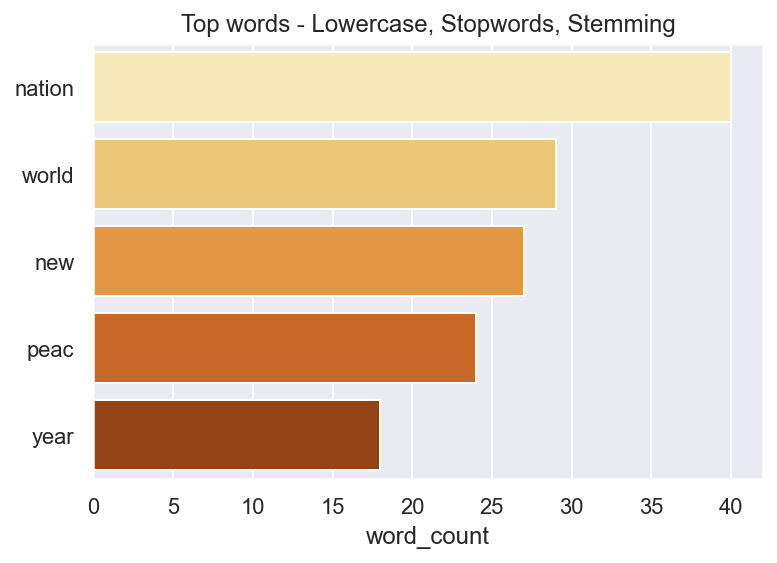

In [255]:
all_words = pd.DataFrame(allwords_series.value_counts(), columns=['word_count'])
all_words = all_words.head(5)
sns.barplot(x=all_words['word_count'], y=all_words.index, palette='YlOrBr');
plt.title('Top words - Lowercase, Stopwords, Stemming')
plt.savefig('all_words_stemmed.jpg', bbox_inches='tight');

## Word Cloud of Clean, Stemmed Bag of Words

In [257]:
!pip install wordcloud

     |████████████████████████████████| 220 kB 8.3 MB/s eta 0:00:01
  Created wheel for wordcloud: filename=wordcloud-1.8.1-cp37-cp37m-macosx_10_9_x86_64.whl size=158509 sha256=e57f1134d067d23b788c14fc993e8389390d1243678c29f87fda67e1ad0c6f04
  Stored in directory: /Users/chetan/Library/Caches/pip/wheels/f8/f6/55/6bd394c32a844a621ca0fe5dbf563c8d71d71edaf095656991
Successfully built wordcloud


In [258]:
from wordcloud import WordCloud,STOPWORDS


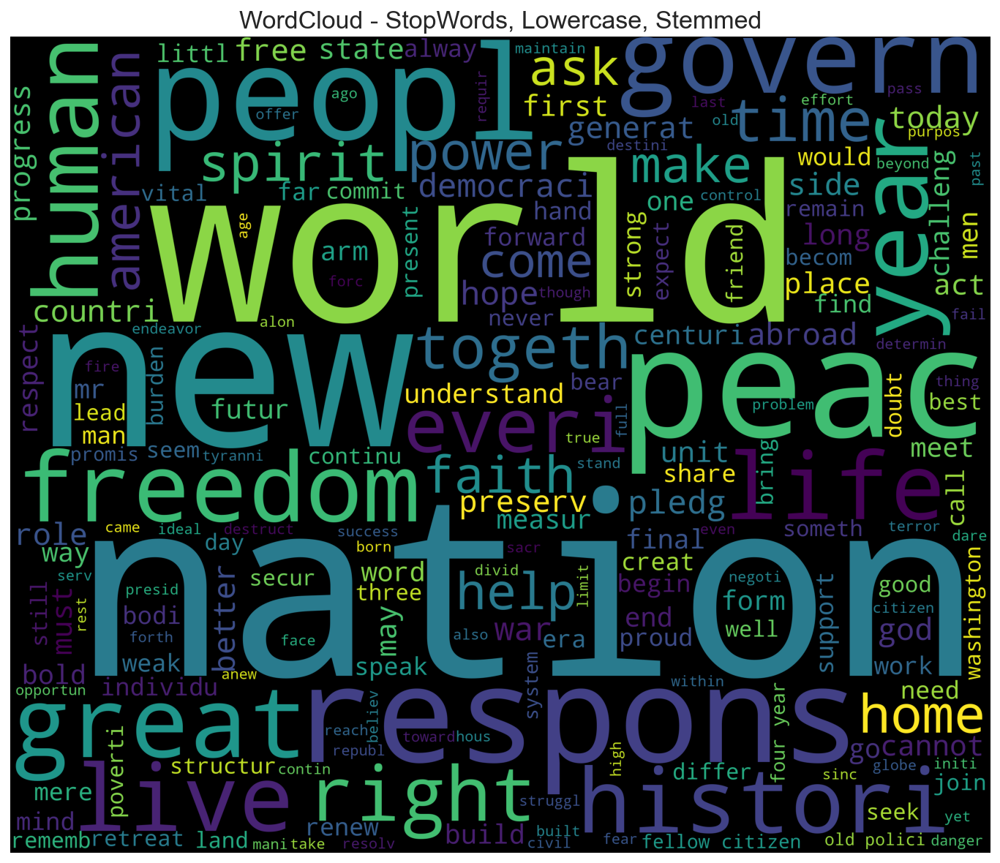

In [271]:
cleaned_word = " ".join([word for word in allwords_clean_stemmed])

wordcloud = WordCloud(stopwords=stopwords,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('WordCloud - StopWords, Lowercase, Stemmed', fontsize=17)
plt.savefig('wordcloud_stemmed.jpg', bbox_inches='tight');
plt.show();





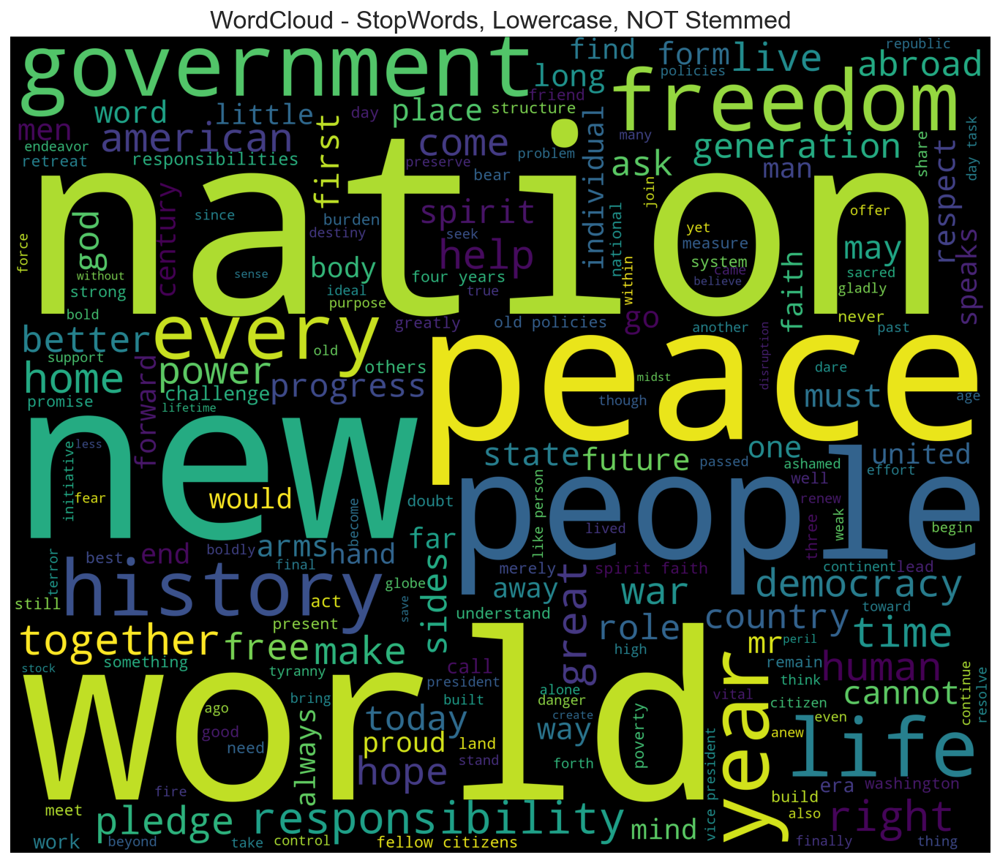

In [273]:
cleaned_word = " ".join([word for word in allwords_clean])

wordcloud = WordCloud(stopwords=stopwords,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('WordCloud - StopWords, Lowercase, NOT Stemmed', fontsize=17)
plt.savefig('wordcloud_not_stemmed.jpg', bbox_inches='tight');
plt.show();






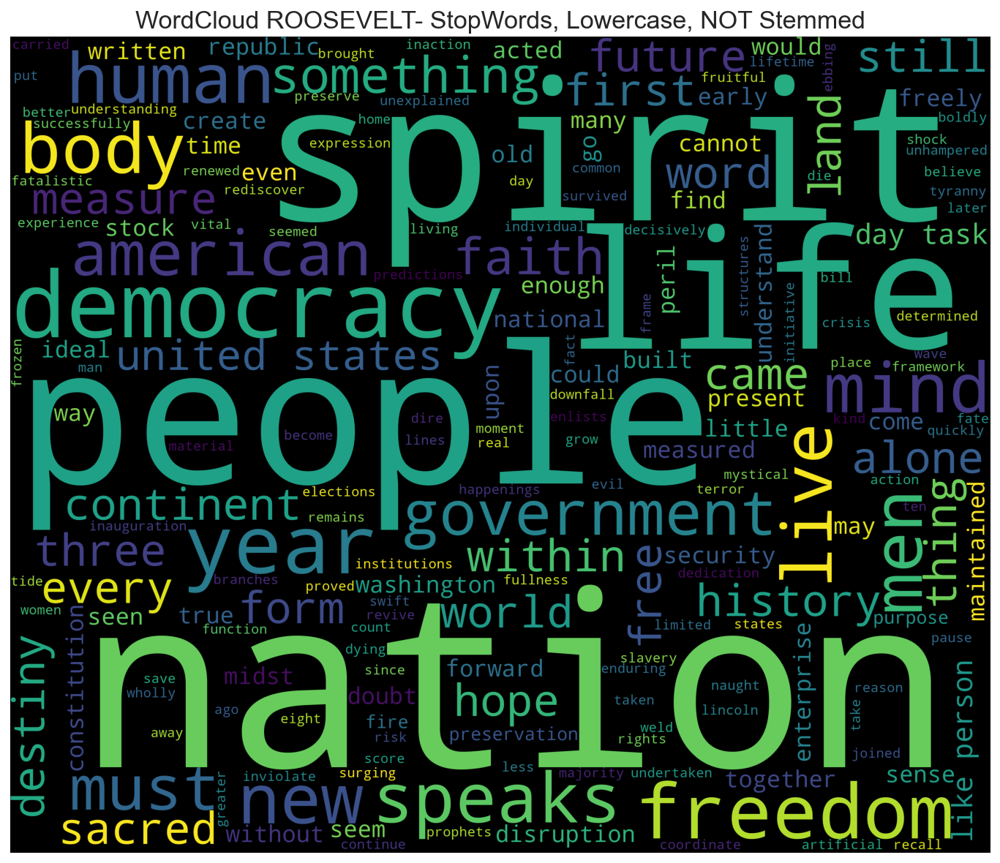

In [274]:
cleaned_word = " ".join([word for word in rwords_clean])

wordcloud = WordCloud(stopwords=stopwords,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('WordCloud ROOSEVELT- StopWords, Lowercase, NOT Stemmed', fontsize=17)
plt.savefig('wordcloud_ROOSE.jpg', bbox_inches='tight');
plt.show();







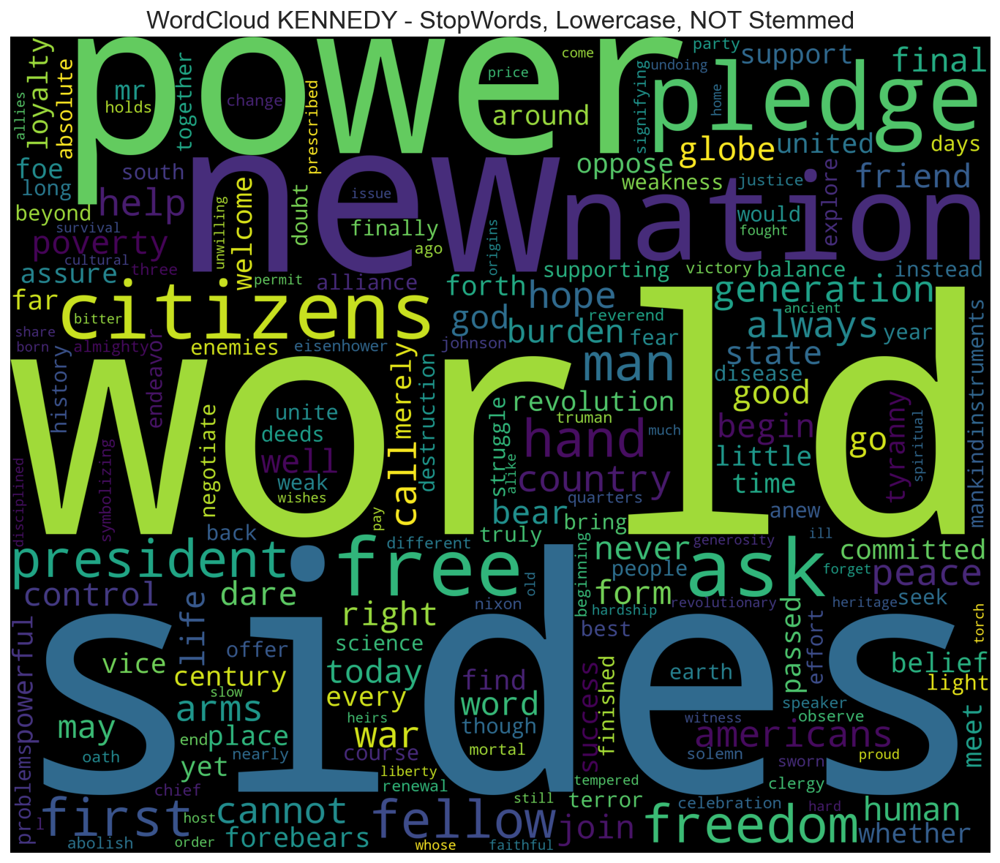

In [275]:
cleaned_word = " ".join([word for word in kwords_clean])

wordcloud = WordCloud(stopwords=stopwords,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('WordCloud KENNEDY - StopWords, Lowercase, NOT Stemmed', fontsize=17)
plt.savefig('wordcloud_KENNEDY.jpg', bbox_inches='tight');
plt.show();







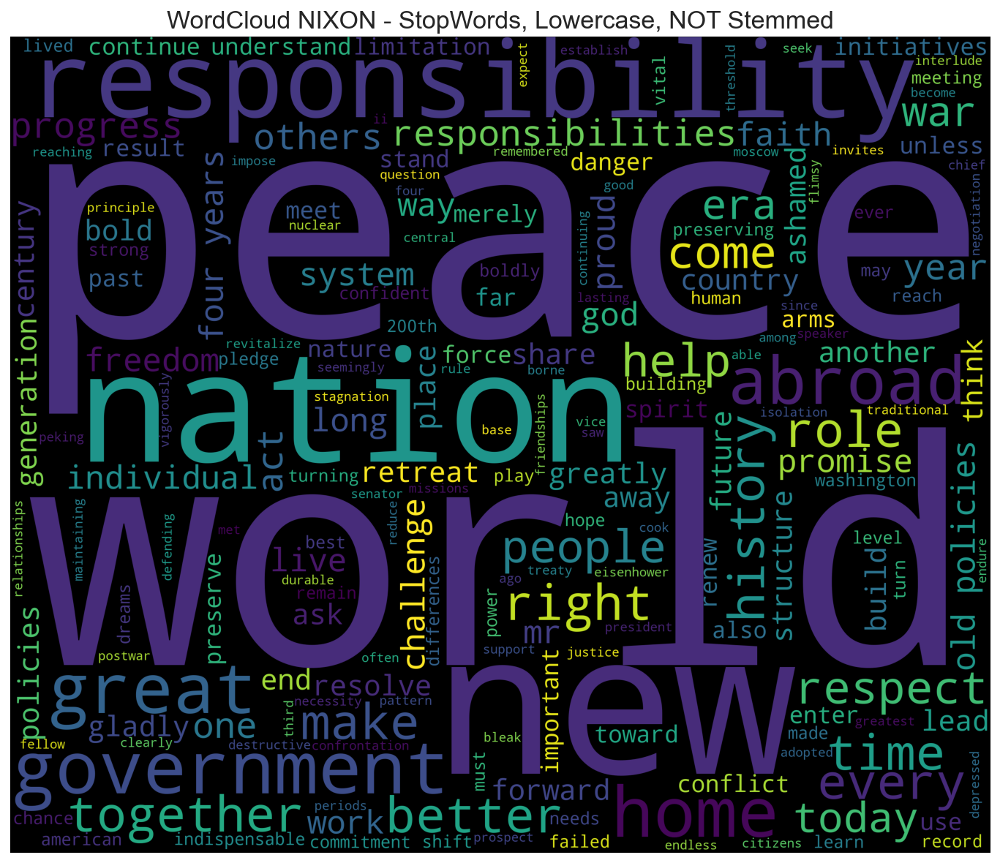

In [276]:
cleaned_word = " ".join([word for word in nwords_clean])

wordcloud = WordCloud(stopwords=stopwords,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('WordCloud NIXON - StopWords, Lowercase, NOT Stemmed', fontsize=17)
plt.savefig('wordcloud_NIXON.jpg', bbox_inches='tight');
plt.show();





